# Times series & clustering : a data visualisation project

Last update: 20/07/2022

## Data source
https://archive.ics.uci.edu/ml/datasets/Gesture+Phase+Segmentation#

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Import data

## 1. a1_va3

In [22]:
a1 = pd.read_csv('gesture_phase_dataset/a1_va3.csv')

In [23]:
a1

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,Phase
0,-0.005009,-0.000964,0.000573,0.008623,0.005667,0.001302,-0.000631,0.000130,-0.000048,0.007762,...,1.880800e-04,0.005133,0.010400,0.000646,0.007871,0.004631,0.000963,0.000092,0.000438,D
1,0.004905,0.001209,-0.000649,0.004737,0.003166,0.000819,-0.000572,-0.000015,0.000023,0.002706,...,-7.500000e-07,0.005093,0.005756,0.000573,0.003459,0.000730,0.000332,0.000012,0.000433,D
2,-0.002393,-0.000216,0.000136,0.003028,0.001212,0.000336,-0.000449,0.000017,0.000047,0.002868,...,-3.920000e-05,0.002406,0.003279,0.000452,0.003261,0.002412,0.000852,0.000042,0.000202,D
3,-0.001394,-0.000242,0.000056,0.001182,0.000575,0.000225,-0.000479,-0.000050,0.000104,0.001171,...,-3.184000e-05,0.001416,0.001334,0.000493,0.001358,0.000313,0.000611,0.000029,0.000596,D
4,-0.000156,-0.000004,0.000023,0.001585,0.000630,0.000094,-0.000303,0.000097,0.000065,0.001579,...,-2.015000e-05,0.000158,0.001709,0.000325,0.001713,0.000203,0.000069,0.000038,0.000069,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1738,0.001042,0.000111,-0.000199,-0.009265,0.002095,-0.000616,0.001041,0.000117,-0.000199,-0.000098,...,7.890000e-05,0.001067,0.009519,0.001066,0.000232,0.000015,0.000210,0.000016,0.000308,D
1739,0.000883,0.000107,-0.000172,0.013037,-0.001307,0.000705,0.000881,0.000115,-0.000172,0.001688,...,2.084600e-04,0.000906,0.013122,0.000905,0.001851,0.000052,0.007290,0.000052,0.000623,D
1740,-0.000141,-0.000053,0.000007,0.011722,-0.000576,0.000647,-0.000143,-0.000045,0.000007,0.001912,...,-1.458000e-05,0.000151,0.011754,0.000150,0.002075,0.000339,0.000486,0.000339,0.000081,D
1741,-0.000043,-0.000060,-0.000004,0.009195,-0.000926,0.000624,-0.000043,-0.000059,-0.000004,0.001912,...,-2.543000e-05,0.000074,0.009262,0.000073,0.001950,0.000016,0.000411,0.000016,0.000136,D


In [24]:
a1.rename(columns={'1':'vlhx','2':'vlhy','3':'vlhz','4':'vrhx','5':'vrhy',
                   '6':'vrhz','7':'vlwx','8':'vlwy','9':'vlwz','10':'vrwx',
                   '11':'vrwy','12':'vrwz','13':'alhx','14':'alhy','15':'alhz',
                   '16':'arhx','17':'arhy','18':'arhz','19':'alwx','20':'alwy',
                   '21':'alwz','22':'arwx','23':'arwy','24':'arwz','25':'slh',
                   '26': 'srh','27':'slw','28':'srw','29':'slh2','30':'srh2',
                   '31':'slw2','32':'srw2'}, inplace = True)
a1

,vlhx,vlhy,vlhz,vrhx,vrhy,vrhz,vlwx,vlwy,vlwz,vrwx,...,arwz,slh,srh,slw,srw,slh2,srh2,slw2,srw2,Phase
0,-0.005009,-0.000964,0.000573,0.008623,0.005667,0.001302,-0.000631,0.000130,-0.000048,0.007762,...,1.880800e-04,0.005133,0.010400,0.000646,0.007871,0.004631,0.000963,0.000092,0.000438,D
1,0.004905,0.001209,-0.000649,0.004737,0.003166,0.000819,-0.000572,-0.000015,0.000023,0.002706,...,-7.500000e-07,0.005093,0.005756,0.000573,0.003459,0.000730,0.000332,0.000012,0.000433,D
2,-0.002393,-0.000216,0.000136,0.003028,0.001212,0.000336,-0.000449,0.000017,0.000047,0.002868,...,-3.920000e-05,0.002406,0.003279,0.000452,0.003261,0.002412,0.000852,0.000042,0.000202,D
3,-0.001394,-0.000242,0.000056,0.001182,0.000575,0.000225,-0.000479,-0.000050,0.000104,0.001171,...,-3.184000e-05,0.001416,0.001334,0.000493,0.001358,0.000313,0.000611,0.000029,0.000596,D
4,-0.000156,-0.000004,0.000023,0.001585,0.000630,0.000094,-0.000303,0.000097,0.000065,0.001579,...,-2.015000e-05,0.000158,0.001709,0.000325,0.001713,0.000203,0.000069,0.000038,0.000069,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1738,0.001042,0.000111,-0.000199,-0.009265,0.002095,-0.000616,0.001041,0.000117,-0.000199,-0.000098,...,7.890000e-05,0.001067,0.009519,0.001066,0.000232,0.000015,0.000210,0.000016,0.000308,D
1739,0.000883,0.000107,-0.000172,0.013037,-0.001307,0.000705,0.000881,0.000115,-0.000172,0.001688,...,2.084600e-04,0.000906,0.013122,0.000905,0.001851,0.000052,0.007290,0.000052,0.000623,D
1740,-0.000141,-0.000053,0.000007,0.011722,-0.000576,0.000647,-0.000143,-0.000045,0.000007,0.001912,...,-1.458000e-05,0.000151,0.011754,0.000150,0.002075,0.000339,0.000486,0.000339,0.000081,D
1741,-0.000043,-0.000060,-0.000004,0.009195,-0.000926,0.000624,-0.000043,-0.000059,-0.000004,0.001912,...,-2.543000e-05,0.000074,0.009262,0.000073,0.001950,0.000016,0.000411,0.000016,0.000136,D


In [25]:
a1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1743 entries, 0 to 1742
Data columns (total 33 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vlhx    1743 non-null   float64
 1   vlhy    1743 non-null   float64
 2   vlhz    1743 non-null   float64
 3   vrhx    1743 non-null   float64
 4   vrhy    1743 non-null   float64
 5   vrhz    1743 non-null   float64
 6   vlwx    1743 non-null   float64
 7   vlwy    1743 non-null   float64
 8   vlwz    1743 non-null   float64
 9   vrwx    1743 non-null   float64
 10  vrwy    1743 non-null   float64
 11  vrwz    1743 non-null   float64
 12  alhx    1743 non-null   float64
 13  alhy    1743 non-null   float64
 14  alhz    1743 non-null   float64
 15  arhx    1743 non-null   float64
 16  arhy    1743 non-null   float64
 17  arhz    1743 non-null   float64
 18  alwx    1743 non-null   float64
 19  alwy    1743 non-null   float64
 20  alwz    1743 non-null   float64
 21  arwx    1743 non-null   float64
 22  

In [27]:
a1['Phase'].value_counts()

D    694
S    656
R    191
P    163
H     39
Name: Phase, dtype: int64

In [14]:
Row_list =[]
  
# Iterate over each row
for index, rows in a1.iterrows():
    # Create list for the current row
    my_list =[rows.vlhx, rows.vlhy, rows.vlhz, 
              rows.vrhx, rows.vrhy, rows.vrhz, 
              rows.vlwx, rows.vlwy, rows.vlwz, 
              rows.vrwx, rows.vrwy, rows.vrwz, 
              rows.alhx, rows.alhy, rows.alhz, 
              rows.arhx, rows.arhy, rows.arhz,
              rows.alwx, rows.alwy, rows.alwz,
              rows.arwx, rows.arwy, rows.arwz,
              rows.slh, rows.srh, rows.slw,
              rows.srw, rows.slh2, rows.srh2,
              rows.slw2, rows.srw2
             ]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[-5.00942e-03, -9.63710e-04,  5.72770e-04, ...,  9.63100e-04,
         9.16400e-05,  4.38310e-04],
       [ 4.90517e-03,  1.20913e-03, -6.48600e-04, ...,  3.31860e-04,
         1.23000e-05,  4.32710e-04],
       [-2.39286e-03, -2.15880e-04,  1.36300e-04, ...,  8.51980e-04,
         4.17000e-05,  2.01530e-04],
       ...,
       [-1.41110e-04, -5.27100e-05,  6.85000e-06, ...,  4.85850e-04,
         3.39220e-04,  8.11000e-05],
       [-4.25900e-05, -6.02900e-05, -3.57000e-06, ...,  4.11500e-04,
         1.64200e-05,  1.36040e-04],
       [-2.08810e-04, -7.19100e-05,  2.83400e-05, ...,  4.82569e-03,
         4.45000e-05,  5.58250e-04]])

In [29]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from itertools import cycle

For n_clusters = 2 The average silhouette_score is : 0.5119868172041633
For n_clusters = 3 The average silhouette_score is : 0.4764681649761529
For n_clusters = 4 The average silhouette_score is : 0.48374027157997296
For n_clusters = 5 The average silhouette_score is : 0.37875408046048253
For n_clusters = 6 The average silhouette_score is : 0.38066238984079004
For n_clusters = 7 The average silhouette_score is : 0.36134344673811347
For n_clusters = 8 The average silhouette_score is : 0.36675042651923373
For n_clusters = 9 The average silhouette_score is : 0.33496852486043666
For n_clusters = 10 The average silhouette_score is : 0.3600946473570779
For n_clusters = 11 The average silhouette_score is : 0.3542084804073887
For n_clusters = 12 The average silhouette_score is : 0.3547559069399643
For n_clusters = 13 The average silhouette_score is : 0.34467871762754215
For n_clusters = 14 The average silhouette_score is : 0.306987087991778
For n_clusters = 15 The average silhouette_score is :

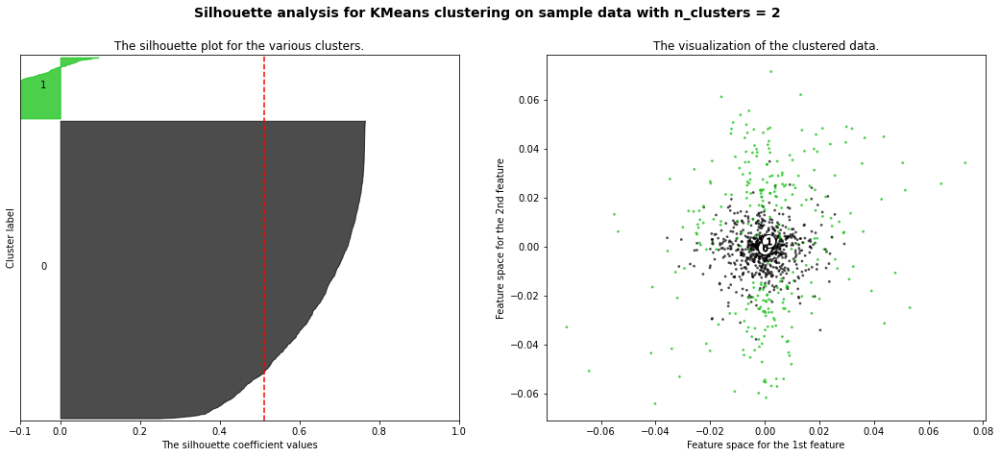

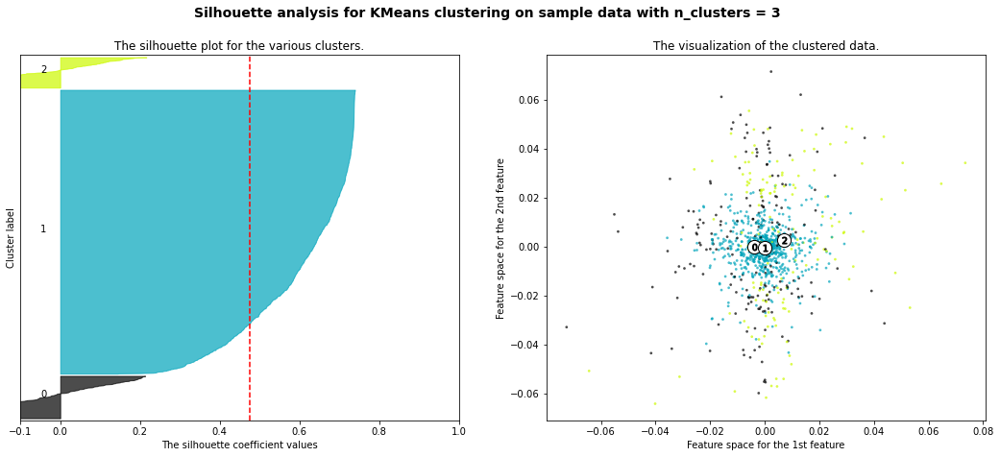

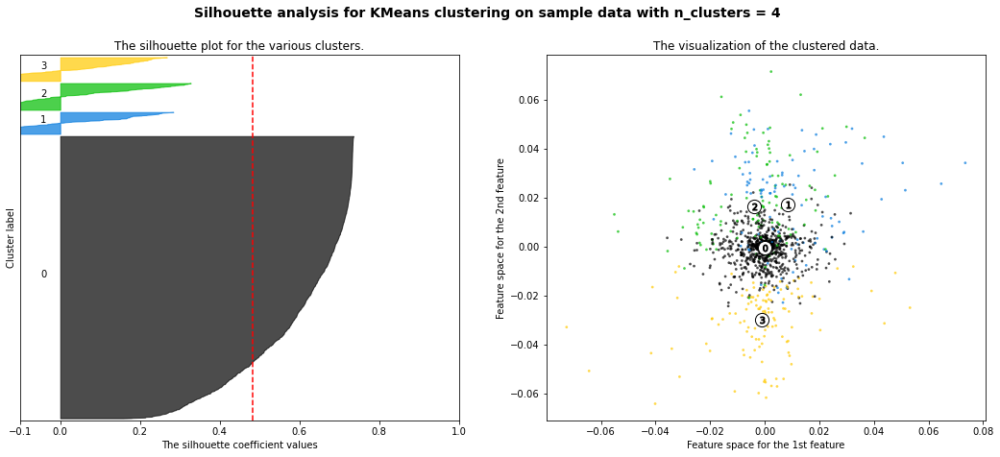

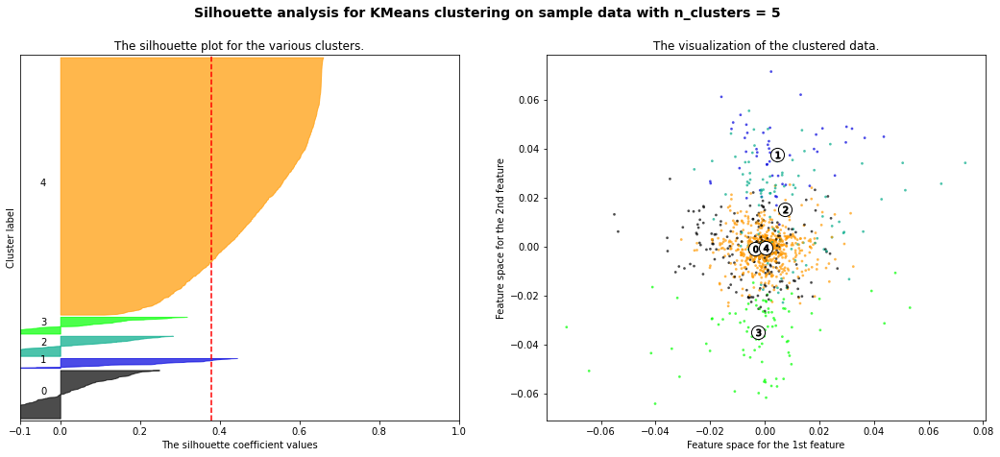

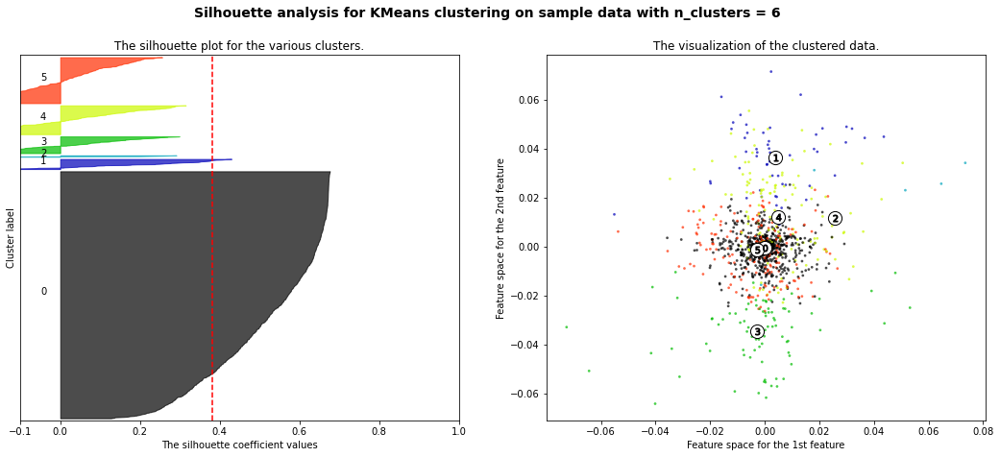

...

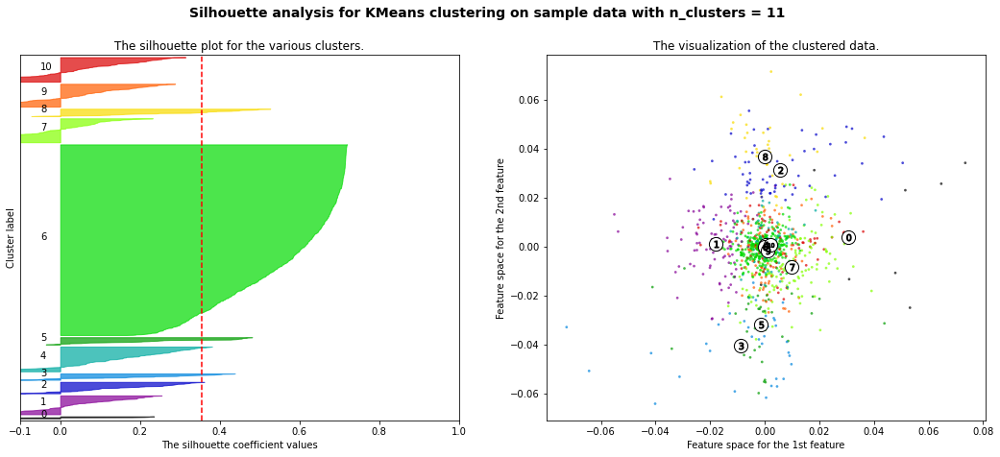

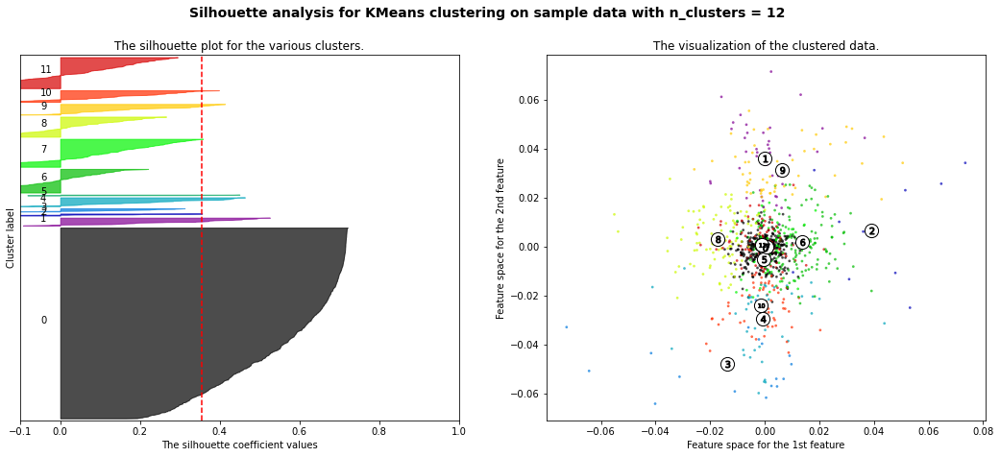

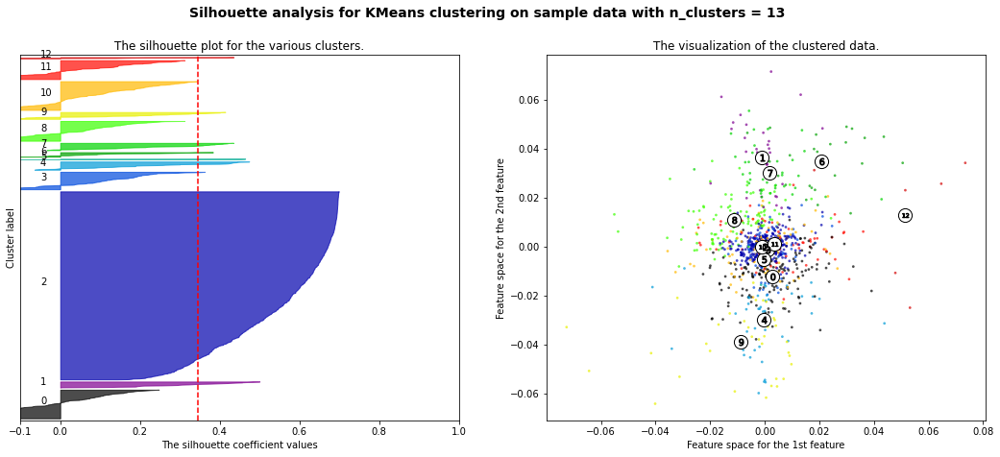

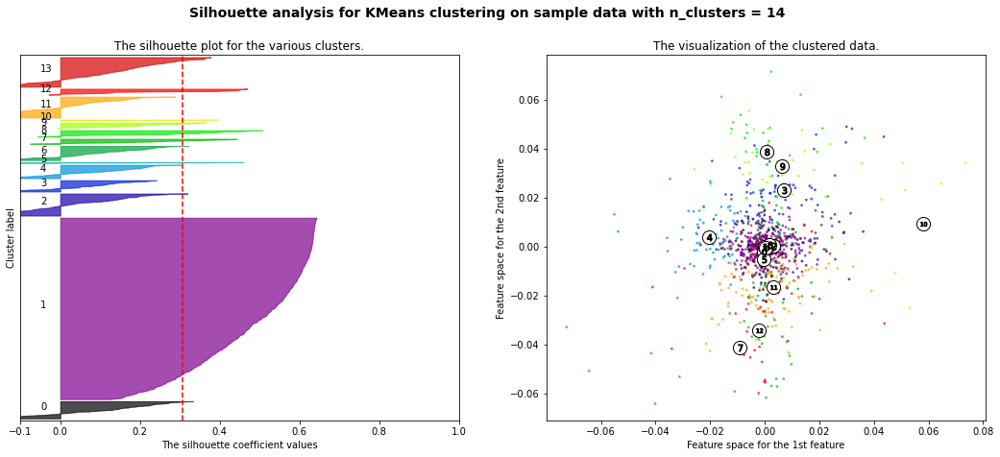

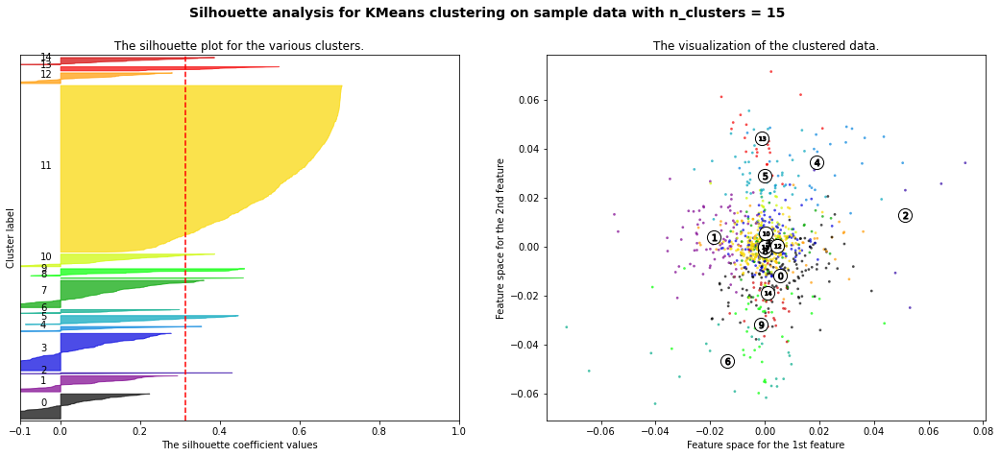

In [20]:
import matplotlib.cm as cm
import numpy as np
from sklearn.datasets import make_blobs

# Set X to array of data
a1_arr = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [2,3,4,5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(a1_arr) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(a1_arr)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(a1_arr, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(a1_arr, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        a1_arr[:, 0], a1_arr[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

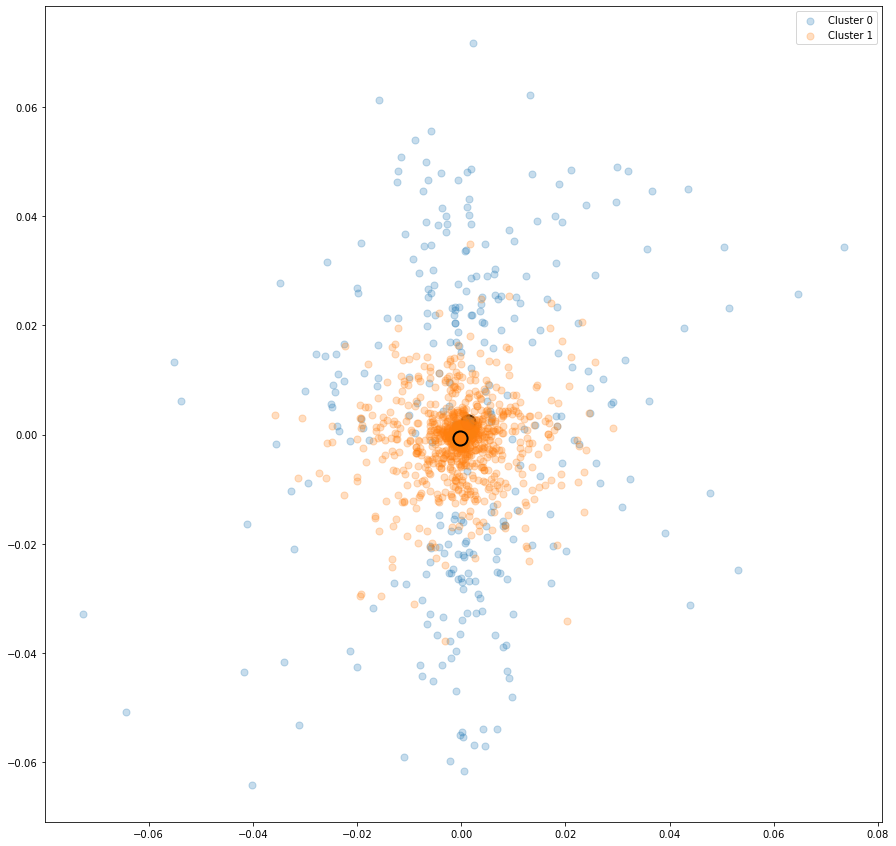

In [30]:
kmeans = KMeans(n_clusters=2).fit(a1_arr)
y_kmeans = kmeans.predict(a1_arr)
centers = kmeans.cluster_centers_
colors = cycle(cm.tab10.colors)
plt.rcParams["figure.figsize"] = (15,15)
for i in range(2):
    color = next(colors)
    idx = y_kmeans == i
    plt.scatter(a1_arr[idx, 0], a1_arr[idx, 1], color=color, s=50, label=f"Cluster {i}", alpha=0.25)  
    plt.scatter(centers[i, 0], centers[i, 1], edgecolors="k", linewidth=2, color=color, s=200, alpha=1)
plt.legend()

##  2. a2_va3

In [32]:
a2 = pd.read_csv('gesture_phase_dataset/a2_va3.csv')
a2

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,Phase
0,0.000005,-0.001857,0.000168,0.000131,-0.000346,0.000133,-0.001732,-0.001807,0.000532,-0.000080,...,0.000087,0.001864,0.000393,0.002559,0.000221,0.000437,0.000854,0.000456,0.000438,D
1,-0.000315,-0.001373,0.000267,-0.001972,0.003837,-0.000523,-0.001306,-0.001276,0.000491,-0.000075,...,-0.000162,0.001434,0.004345,0.001891,0.000464,0.000184,0.001477,0.000213,0.000200,D
2,-0.000062,0.000436,0.000166,0.001393,-0.000442,0.000208,0.000978,0.000517,-0.000007,-0.000097,...,0.000129,0.000471,0.001476,0.001106,0.002402,0.000538,0.001615,0.000867,0.000622,D
3,0.000727,0.001626,0.000234,-0.000131,0.000611,-0.000129,0.001150,0.001554,-0.000068,0.000364,...,-0.000085,0.001796,0.000638,0.001935,0.000375,0.000621,0.000818,0.000458,0.001084,D
4,0.000675,0.000493,0.000179,0.001253,-0.002160,0.000288,0.000606,0.000395,-0.000015,0.001053,...,0.000121,0.000854,0.002514,0.000724,0.001933,0.000366,0.001008,0.000413,0.000560,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1255,-0.000205,-0.011925,-0.001228,-0.000068,-0.009515,-0.000888,-0.006188,-0.001810,-0.001355,-0.000769,...,0.000028,0.011990,0.009556,0.006589,0.005133,0.000948,0.000705,0.000203,0.000102,R
1256,-0.000512,-0.008675,-0.000836,0.000104,-0.006742,-0.000619,-0.007582,-0.007929,-0.000503,-0.001528,...,0.000108,0.008730,0.006771,0.010982,0.006924,0.000522,0.000443,0.001005,0.000321,R
1257,-0.000679,-0.005859,-0.000635,0.000279,-0.006121,-0.000282,-0.003322,-0.006726,-0.000052,-0.001570,...,-0.000008,0.005933,0.006133,0.007502,0.005719,0.000410,0.000105,0.000645,0.000182,R
1258,-0.001319,-0.004339,-0.000651,0.000340,-0.004804,-0.000550,-0.003313,-0.006431,0.000018,-0.000515,...,-0.000043,0.004582,0.004847,0.007234,0.005123,0.000446,0.000364,0.000082,0.000309,R


In [34]:
a2.rename(columns={'1':'vlhx','2':'vlhy','3':'vlhz','4':'vrhx','5':'vrhy',
                   '6':'vrhz','7':'vlwx','8':'vlwy','9':'vlwz','10':'vrwx',
                   '11':'vrwy','12':'vrwz','13':'alhx','14':'alhy','15':'alhz',
                   '16':'arhx','17':'arhy','18':'arhz','19':'alwx','20':'alwy',
                   '21':'alwz','22':'arwx','23':'arwy','24':'arwz','25':'slh',
                   '26': 'srh','27':'slw','28':'srw','29':'slh2','30':'srh2',
                   '31':'slw2','32':'srw2'}, inplace = True)
a2

,vlhx,vlhy,vlhz,vrhx,vrhy,vrhz,vlwx,vlwy,vlwz,vrwx,...,arwz,slh,srh,slw,srw,slh2,srh2,slw2,srw2,Phase
0,0.000005,-0.001857,0.000168,0.000131,-0.000346,0.000133,-0.001732,-0.001807,0.000532,-0.000080,...,0.000087,0.001864,0.000393,0.002559,0.000221,0.000437,0.000854,0.000456,0.000438,D
1,-0.000315,-0.001373,0.000267,-0.001972,0.003837,-0.000523,-0.001306,-0.001276,0.000491,-0.000075,...,-0.000162,0.001434,0.004345,0.001891,0.000464,0.000184,0.001477,0.000213,0.000200,D
2,-0.000062,0.000436,0.000166,0.001393,-0.000442,0.000208,0.000978,0.000517,-0.000007,-0.000097,...,0.000129,0.000471,0.001476,0.001106,0.002402,0.000538,0.001615,0.000867,0.000622,D
3,0.000727,0.001626,0.000234,-0.000131,0.000611,-0.000129,0.001150,0.001554,-0.000068,0.000364,...,-0.000085,0.001796,0.000638,0.001935,0.000375,0.000621,0.000818,0.000458,0.001084,D
4,0.000675,0.000493,0.000179,0.001253,-0.002160,0.000288,0.000606,0.000395,-0.000015,0.001053,...,0.000121,0.000854,0.002514,0.000724,0.001933,0.000366,0.001008,0.000413,0.000560,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1255,-0.000205,-0.011925,-0.001228,-0.000068,-0.009515,-0.000888,-0.006188,-0.001810,-0.001355,-0.000769,...,0.000028,0.011990,0.009556,0.006589,0.005133,0.000948,0.000705,0.000203,0.000102,R
1256,-0.000512,-0.008675,-0.000836,0.000104,-0.006742,-0.000619,-0.007582,-0.007929,-0.000503,-0.001528,...,0.000108,0.008730,0.006771,0.010982,0.006924,0.000522,0.000443,0.001005,0.000321,R
1257,-0.000679,-0.005859,-0.000635,0.000279,-0.006121,-0.000282,-0.003322,-0.006726,-0.000052,-0.001570,...,-0.000008,0.005933,0.006133,0.007502,0.005719,0.000410,0.000105,0.000645,0.000182,R
1258,-0.001319,-0.004339,-0.000651,0.000340,-0.004804,-0.000550,-0.003313,-0.006431,0.000018,-0.000515,...,-0.000043,0.004582,0.004847,0.007234,0.005123,0.000446,0.000364,0.000082,0.000309,R


In [35]:
a2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1260 entries, 0 to 1259
Data columns (total 33 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vlhx    1260 non-null   float64
 1   vlhy    1260 non-null   float64
 2   vlhz    1260 non-null   float64
 3   vrhx    1260 non-null   float64
 4   vrhy    1260 non-null   float64
 5   vrhz    1260 non-null   float64
 6   vlwx    1260 non-null   float64
 7   vlwy    1260 non-null   float64
 8   vlwz    1260 non-null   float64
 9   vrwx    1260 non-null   float64
 10  vrwy    1260 non-null   float64
 11  vrwz    1260 non-null   float64
 12  alhx    1260 non-null   float64
 13  alhy    1260 non-null   float64
 14  alhz    1260 non-null   float64
 15  arhx    1260 non-null   float64
 16  arhy    1260 non-null   float64
 17  arhz    1260 non-null   float64
 18  alwx    1260 non-null   float64
 19  alwy    1260 non-null   float64
 20  alwz    1260 non-null   float64
 21  arwx    1260 non-null   float64
 22  

In [36]:
a2['Phase'].value_counts()

D    489
S    431
P    200
R     86
H     54
Name: Phase, dtype: int64

In [37]:
Row_list =[]
  
# Iterate over each row
for index, rows in a2.iterrows():
    # Create list for the current row
    my_list =[rows.vlhx, rows.vlhy, rows.vlhz, 
              rows.vrhx, rows.vrhy, rows.vrhz, 
              rows.vlwx, rows.vlwy, rows.vlwz, 
              rows.vrwx, rows.vrwy, rows.vrwz, 
              rows.alhx, rows.alhy, rows.alhz, 
              rows.arhx, rows.arhy, rows.arhz,
              rows.alwx, rows.alwy, rows.alwz,
              rows.arwx, rows.arwy, rows.arwz,
              rows.slh, rows.srh, rows.slw,
              rows.srw, rows.slh2, rows.srh2,
              rows.slw2, rows.srw2
             ]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[ 5.17000e-06, -1.85676e-03,  1.68140e-04, ...,  8.53960e-04,
         4.55650e-04,  4.37930e-04],
       [-3.15210e-04, -1.37327e-03,  2.67000e-04, ...,  1.47731e-03,
         2.13100e-04,  2.00340e-04],
       [-6.22800e-05,  4.36330e-04,  1.65620e-04, ...,  1.61534e-03,
         8.66540e-04,  6.22050e-04],
       ...,
       [-6.79280e-04, -5.85929e-03, -6.35250e-04, ...,  1.05470e-04,
         6.44900e-04,  1.82410e-04],
       [-1.31896e-03, -4.33936e-03, -6.50620e-04, ...,  3.63620e-04,
         8.19700e-05,  3.09200e-04],
       [-2.21779e-03, -4.34083e-03, -9.69620e-04, ...,  6.64960e-04,
         2.80622e-03,  1.37351e-03]])

For n_clusters = 2 The average silhouette_score is : 0.4853321348032265
For n_clusters = 3 The average silhouette_score is : 0.4925806793865972
For n_clusters = 4 The average silhouette_score is : 0.40343625501394137
For n_clusters = 5 The average silhouette_score is : 0.42940382227578244
For n_clusters = 6 The average silhouette_score is : 0.4297743475136127
For n_clusters = 7 The average silhouette_score is : 0.4207368719174587
For n_clusters = 8 The average silhouette_score is : 0.4246544418960577
For n_clusters = 9 The average silhouette_score is : 0.4220103455859459
For n_clusters = 10 The average silhouette_score is : 0.36778472076438795
For n_clusters = 11 The average silhouette_score is : 0.37263380737897706
For n_clusters = 12 The average silhouette_score is : 0.3620590343619419
For n_clusters = 13 The average silhouette_score is : 0.3308783947746839
For n_clusters = 14 The average silhouette_score is : 0.30912758469540713
For n_clusters = 15 The average silhouette_score is : 

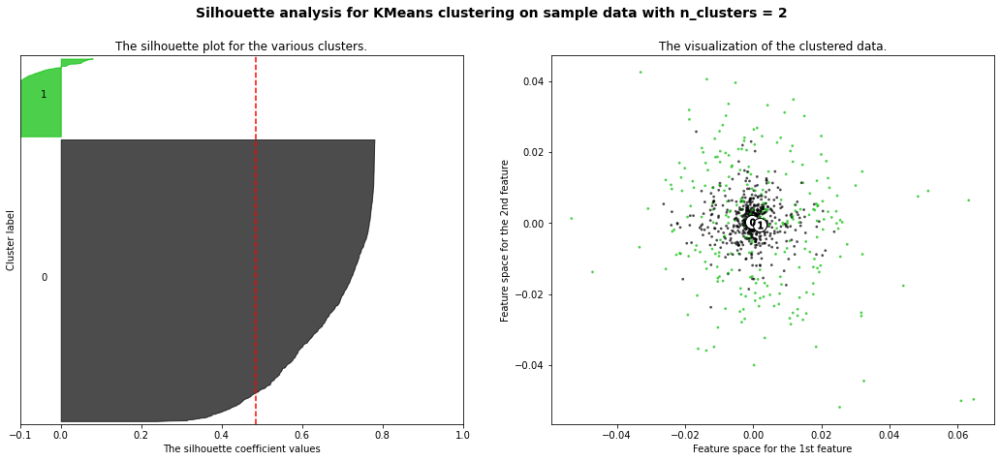

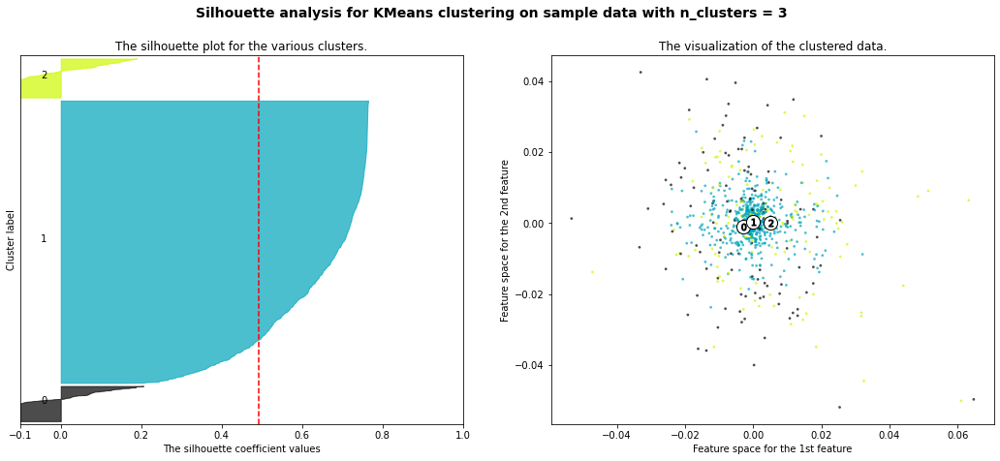

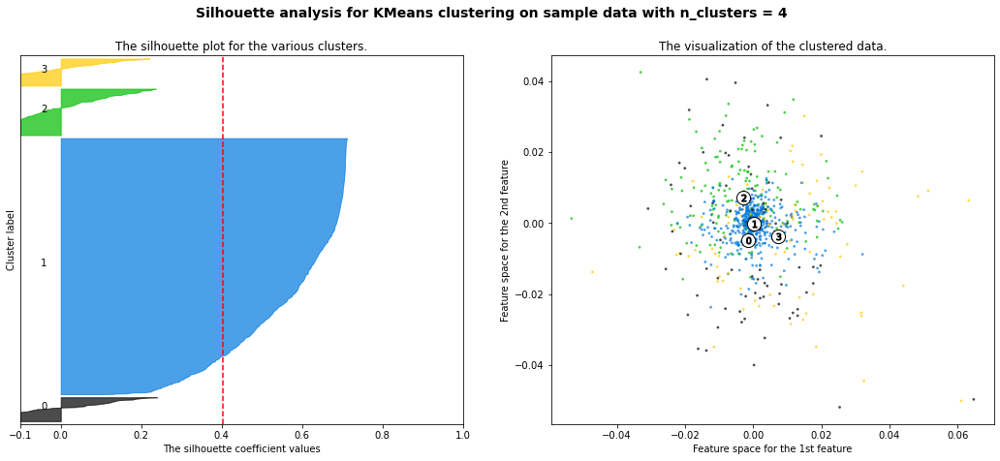

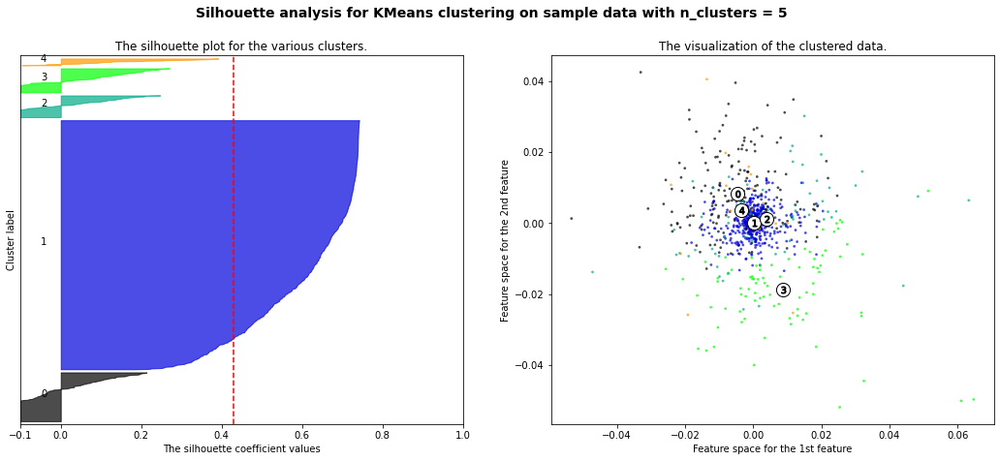

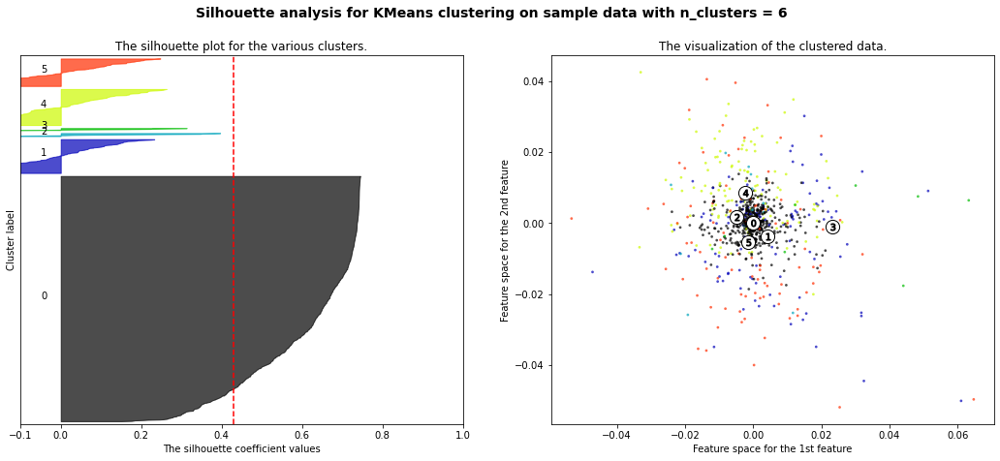

...

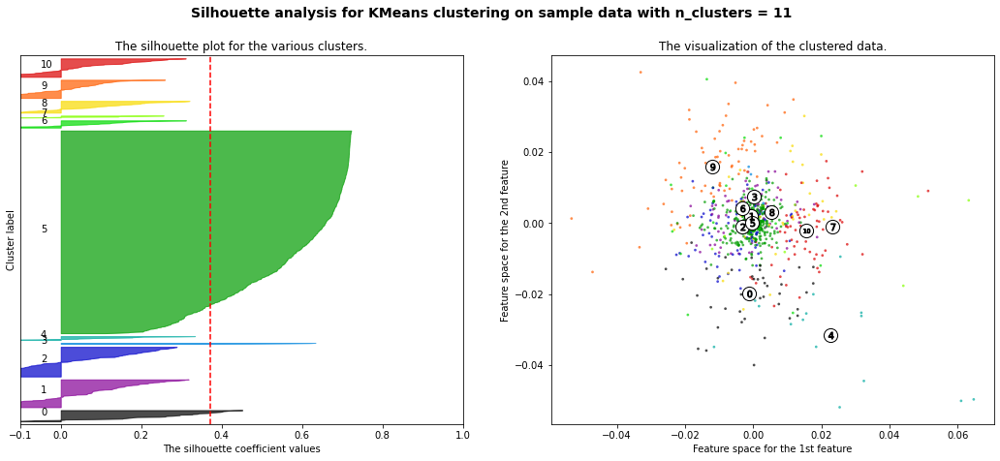

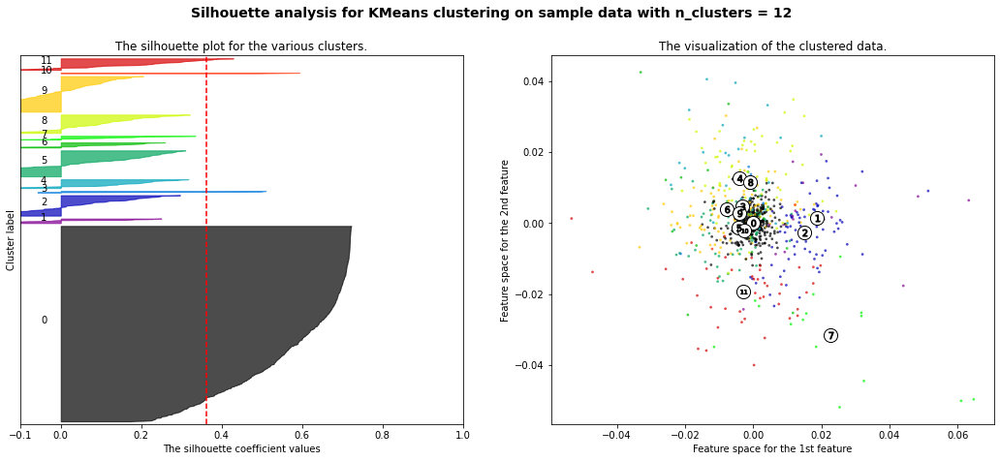

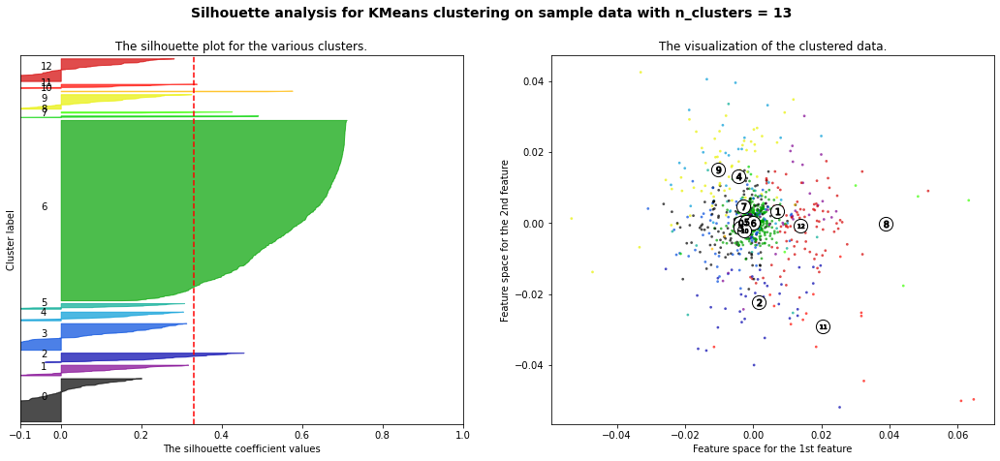

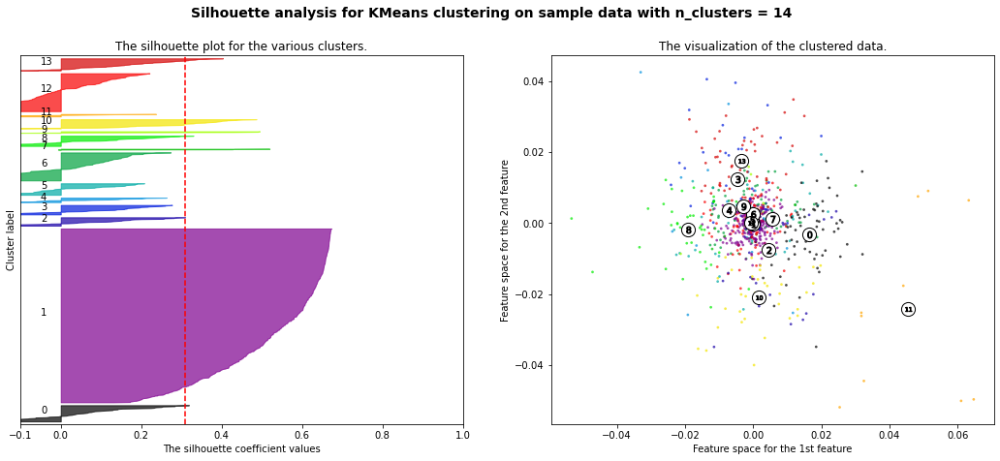

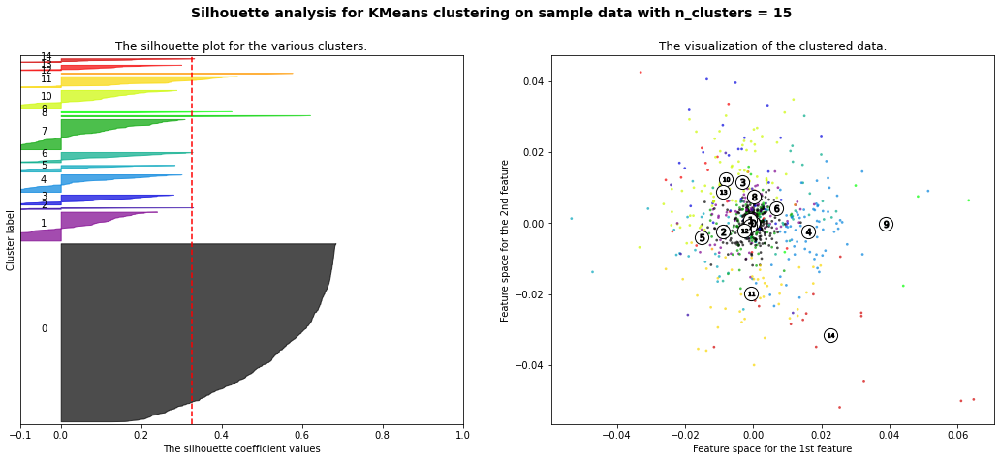

In [39]:
import matplotlib.cm as cm
import numpy as np
from sklearn.datasets import make_blobs

# Set X to array of data
a2_arr = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [2,3,4,5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(a2_arr) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(a2_arr)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(a2_arr, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(a2_arr, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        a2_arr[:, 0], a2_arr[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

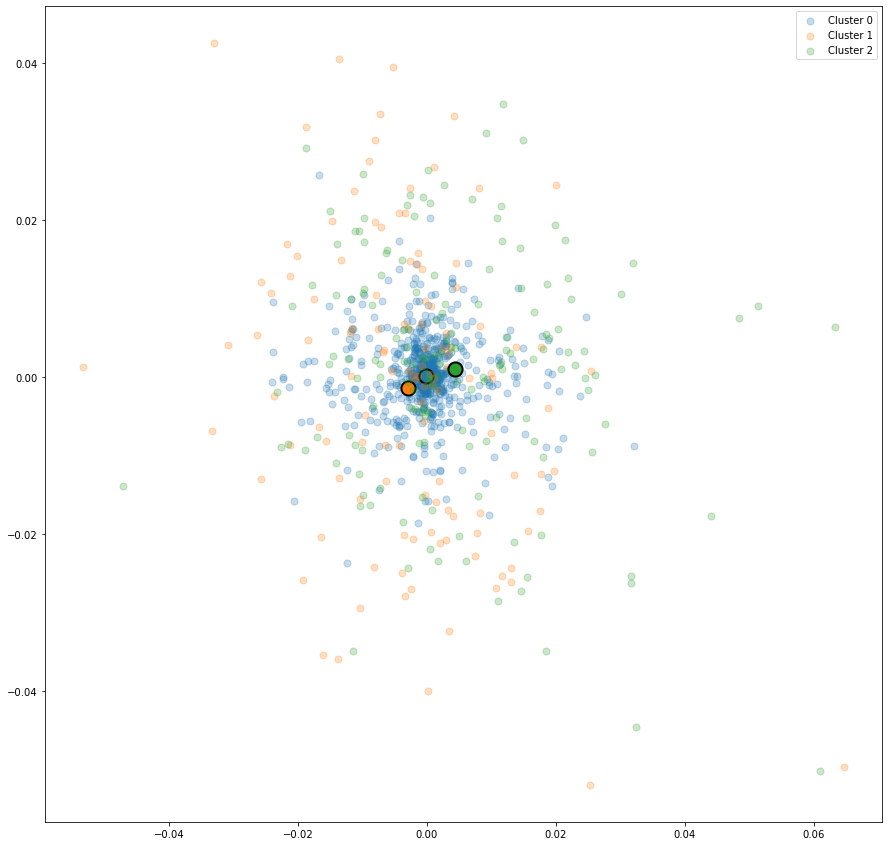

In [40]:
kmeans = KMeans(n_clusters=3).fit(a2_arr)
y_kmeans = kmeans.predict(a2_arr)
centers = kmeans.cluster_centers_
colors = cycle(cm.tab10.colors)
plt.rcParams["figure.figsize"] = (15,15)
for i in range(3):
    color = next(colors)
    idx = y_kmeans == i
    plt.scatter(a2_arr[idx, 0], a2_arr[idx, 1], color=color, s=50, label=f"Cluster {i}", alpha=0.25)  
    plt.scatter(centers[i, 0], centers[i, 1], edgecolors="k", linewidth=2, color=color, s=200, alpha=1)
plt.legend()

## 3. a3_va3

In [41]:
a3 = pd.read_csv('gesture_phase_dataset/a3_va3.csv')
a3

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,Phase
0,-0.000010,-0.000021,0.000005,-0.000006,0.000043,-0.000011,0.000004,-0.000027,0.000006,-2.852000e-05,...,-1.770000e-06,0.000024,0.000045,0.000028,0.000084,0.000003,0.000010,0.000004,0.000015,D
1,-0.000006,-0.000017,0.000004,-0.000020,0.000064,-0.000010,0.000008,-0.000023,0.000005,-4.526000e-05,...,-1.770000e-06,0.000019,0.000068,0.000025,0.000154,0.000002,0.000008,0.000002,0.000021,D
2,-0.000025,-0.000026,0.000004,-0.000027,0.000061,-0.000008,-0.000005,-0.000030,0.000007,-5.296000e-05,...,9.100000e-07,0.000036,0.000067,0.000031,0.000154,0.000006,0.000003,0.000005,0.000003,D
3,-0.000041,-0.000037,0.000005,-0.000033,0.000060,-0.000006,-0.000020,-0.000038,0.000009,-5.116000e-05,...,1.660000e-06,0.000055,0.000069,0.000044,0.000127,0.000006,0.000002,0.000005,0.000008,D
4,-0.000052,-0.000046,0.000005,-0.000030,0.000044,-0.000004,-0.000029,-0.000045,0.000010,-3.944000e-05,...,2.100000e-06,0.000069,0.000054,0.000054,0.000068,0.000004,0.000005,0.000003,0.000018,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1825,0.000455,-0.000141,-0.000153,0.000054,-0.000193,-0.000097,0.000749,-0.000195,-0.000254,4.191000e-05,...,7.000000e-06,0.000500,0.000222,0.000815,0.000353,0.000122,0.000020,0.000102,0.000027,D
1826,0.000219,-0.000073,-0.000124,0.000058,-0.000168,-0.000070,0.000441,-0.000103,-0.000196,4.712000e-05,...,5.790000e-06,0.000262,0.000191,0.000494,0.000292,0.000062,0.000009,0.000082,0.000016,D
1827,0.000080,-0.000060,-0.000115,0.000039,-0.000176,-0.000058,0.000226,-0.000069,-0.000165,2.376000e-05,...,2.730000e-06,0.000153,0.000189,0.000288,0.000285,0.000042,0.000007,0.000067,0.000008,D
1828,-0.000021,-0.000067,-0.000111,0.000034,-0.000185,-0.000048,0.000054,-0.000065,-0.000143,8.810000e-06,...,2.030000e-06,0.000132,0.000194,0.000166,0.000292,0.000031,0.000005,0.000054,0.000006,D


In [42]:
a3.rename(columns={'1':'vlhx','2':'vlhy','3':'vlhz','4':'vrhx','5':'vrhy',
                   '6':'vrhz','7':'vlwx','8':'vlwy','9':'vlwz','10':'vrwx',
                   '11':'vrwy','12':'vrwz','13':'alhx','14':'alhy','15':'alhz',
                   '16':'arhx','17':'arhy','18':'arhz','19':'alwx','20':'alwy',
                   '21':'alwz','22':'arwx','23':'arwy','24':'arwz','25':'slh',
                   '26': 'srh','27':'slw','28':'srw','29':'slh2','30':'srh2',
                   '31':'slw2','32':'srw2'}, inplace = True)
a3

,vlhx,vlhy,vlhz,vrhx,vrhy,vrhz,vlwx,vlwy,vlwz,vrwx,...,arwz,slh,srh,slw,srw,slh2,srh2,slw2,srw2,Phase
0,-0.000010,-0.000021,0.000005,-0.000006,0.000043,-0.000011,0.000004,-0.000027,0.000006,-2.852000e-05,...,-1.770000e-06,0.000024,0.000045,0.000028,0.000084,0.000003,0.000010,0.000004,0.000015,D
1,-0.000006,-0.000017,0.000004,-0.000020,0.000064,-0.000010,0.000008,-0.000023,0.000005,-4.526000e-05,...,-1.770000e-06,0.000019,0.000068,0.000025,0.000154,0.000002,0.000008,0.000002,0.000021,D
2,-0.000025,-0.000026,0.000004,-0.000027,0.000061,-0.000008,-0.000005,-0.000030,0.000007,-5.296000e-05,...,9.100000e-07,0.000036,0.000067,0.000031,0.000154,0.000006,0.000003,0.000005,0.000003,D
3,-0.000041,-0.000037,0.000005,-0.000033,0.000060,-0.000006,-0.000020,-0.000038,0.000009,-5.116000e-05,...,1.660000e-06,0.000055,0.000069,0.000044,0.000127,0.000006,0.000002,0.000005,0.000008,D
4,-0.000052,-0.000046,0.000005,-0.000030,0.000044,-0.000004,-0.000029,-0.000045,0.000010,-3.944000e-05,...,2.100000e-06,0.000069,0.000054,0.000054,0.000068,0.000004,0.000005,0.000003,0.000018,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1825,0.000455,-0.000141,-0.000153,0.000054,-0.000193,-0.000097,0.000749,-0.000195,-0.000254,4.191000e-05,...,7.000000e-06,0.000500,0.000222,0.000815,0.000353,0.000122,0.000020,0.000102,0.000027,D
1826,0.000219,-0.000073,-0.000124,0.000058,-0.000168,-0.000070,0.000441,-0.000103,-0.000196,4.712000e-05,...,5.790000e-06,0.000262,0.000191,0.000494,0.000292,0.000062,0.000009,0.000082,0.000016,D
1827,0.000080,-0.000060,-0.000115,0.000039,-0.000176,-0.000058,0.000226,-0.000069,-0.000165,2.376000e-05,...,2.730000e-06,0.000153,0.000189,0.000288,0.000285,0.000042,0.000007,0.000067,0.000008,D
1828,-0.000021,-0.000067,-0.000111,0.000034,-0.000185,-0.000048,0.000054,-0.000065,-0.000143,8.810000e-06,...,2.030000e-06,0.000132,0.000194,0.000166,0.000292,0.000031,0.000005,0.000054,0.000006,D


In [44]:
a3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1830 entries, 0 to 1829
Data columns (total 33 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vlhx    1830 non-null   float64
 1   vlhy    1830 non-null   float64
 2   vlhz    1830 non-null   float64
 3   vrhx    1830 non-null   float64
 4   vrhy    1830 non-null   float64
 5   vrhz    1830 non-null   float64
 6   vlwx    1830 non-null   float64
 7   vlwy    1830 non-null   float64
 8   vlwz    1830 non-null   float64
 9   vrwx    1830 non-null   float64
 10  vrwy    1830 non-null   float64
 11  vrwz    1830 non-null   float64
 12  alhx    1830 non-null   float64
 13  alhy    1830 non-null   float64
 14  alhz    1830 non-null   float64
 15  arhx    1830 non-null   float64
 16  arhy    1830 non-null   float64
 17  arhz    1830 non-null   float64
 18  alwx    1830 non-null   float64
 19  alwy    1830 non-null   float64
 20  alwz    1830 non-null   float64
 21  arwx    1830 non-null   float64
 22  

In [43]:
a3['Phase'].value_counts()

D    658
S    535
P    279
R    208
H    150
Name: Phase, dtype: int64

In [45]:
Row_list =[]
  
# Iterate over each row
for index, rows in a3.iterrows():
    # Create list for the current row
    my_list =[rows.vlhx, rows.vlhy, rows.vlhz, 
              rows.vrhx, rows.vrhy, rows.vrhz, 
              rows.vlwx, rows.vlwy, rows.vlwz, 
              rows.vrwx, rows.vrwy, rows.vrwz, 
              rows.alhx, rows.alhy, rows.alhz, 
              rows.arhx, rows.arhy, rows.arhz,
              rows.alwx, rows.alwy, rows.alwz,
              rows.arwx, rows.arwy, rows.arwz,
              rows.slh, rows.srh, rows.slw,
              rows.srw, rows.slh2, rows.srh2,
              rows.slw2, rows.srw2
             ]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[-9.9200e-06, -2.1350e-05,  4.8300e-06, ...,  9.5600e-06,
         4.0500e-06,  1.4830e-05],
       [-6.4800e-06, -1.7390e-05,  4.1100e-06, ...,  7.5000e-06,
         1.8500e-06,  2.1020e-05],
       [-2.4560e-05, -2.5730e-05,  4.1400e-06, ...,  2.7900e-06,
         4.7200e-06,  2.6900e-06],
       ...,
       [ 7.9800e-05, -6.0230e-05, -1.1519e-04, ...,  7.1100e-06,
         6.6800e-05,  7.5900e-06],
       [-2.0600e-05, -6.6910e-05, -1.1147e-04, ...,  4.7600e-06,
         5.4040e-05,  5.9100e-06],
       [-1.0432e-04, -7.9000e-05, -1.0556e-04, ...,  3.3900e-06,
         3.0500e-05,  3.6100e-06]])

For n_clusters = 2 The average silhouette_score is : 0.580139379675943
For n_clusters = 3 The average silhouette_score is : 0.6120723930024249
For n_clusters = 4 The average silhouette_score is : 0.6016105946714781
For n_clusters = 5 The average silhouette_score is : 0.5454015455276237
For n_clusters = 6 The average silhouette_score is : 0.4737632096532422
For n_clusters = 7 The average silhouette_score is : 0.4637395386565675
For n_clusters = 8 The average silhouette_score is : 0.4669685557136152
For n_clusters = 9 The average silhouette_score is : 0.4748283758120551
For n_clusters = 10 The average silhouette_score is : 0.47788138270989494
For n_clusters = 11 The average silhouette_score is : 0.48141287597660565
For n_clusters = 12 The average silhouette_score is : 0.48892794119726174
For n_clusters = 13 The average silhouette_score is : 0.41539458184179573
For n_clusters = 14 The average silhouette_score is : 0.42080177591291645
For n_clusters = 15 The average silhouette_score is : 0

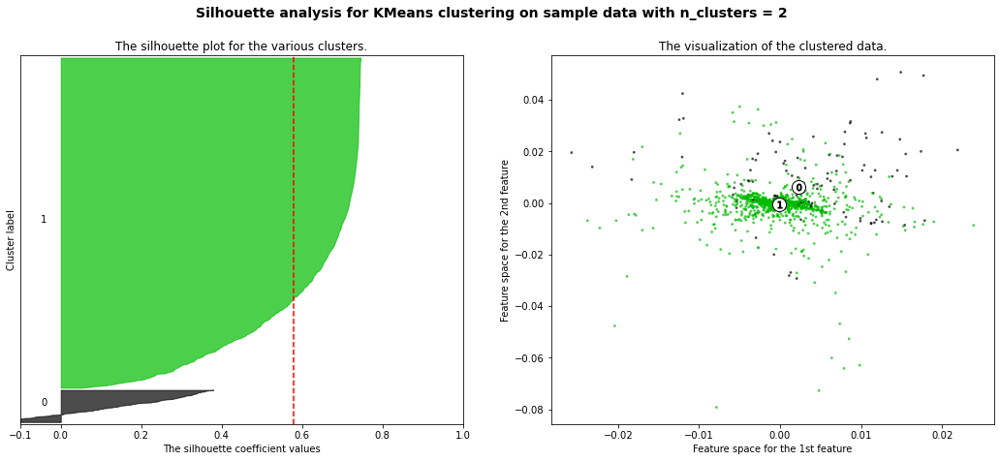

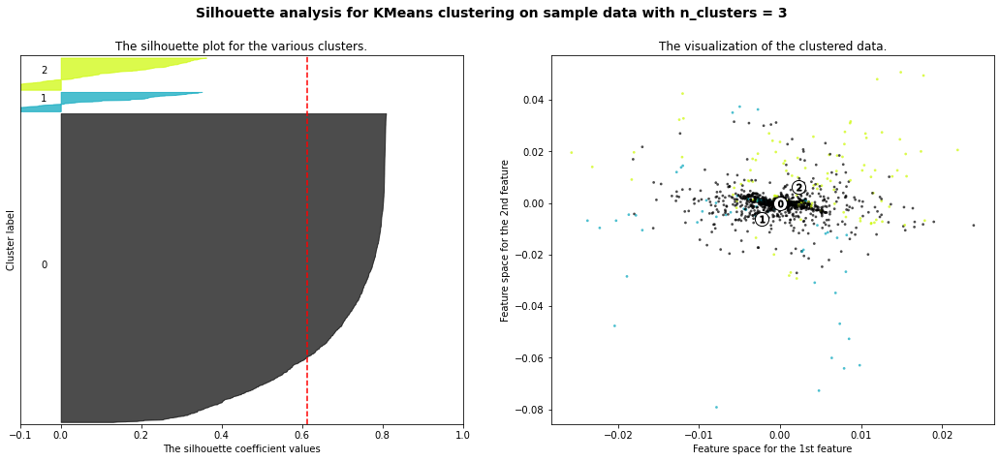

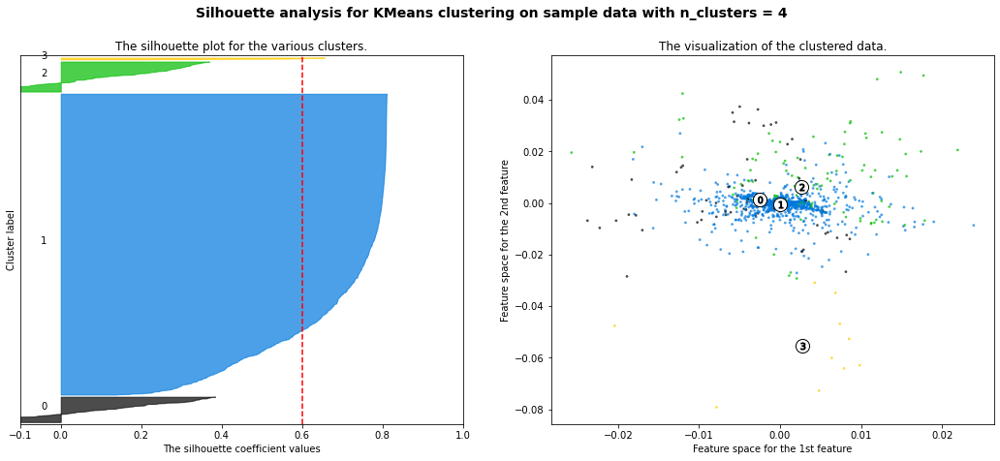

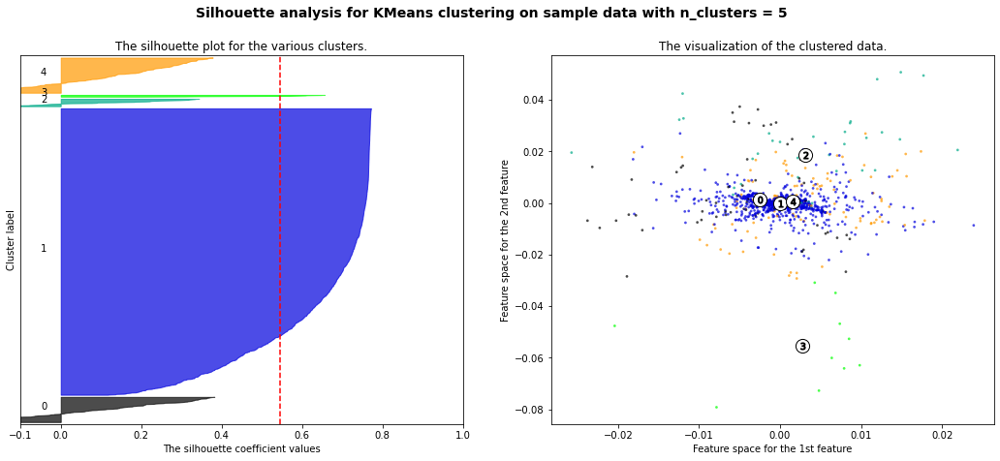

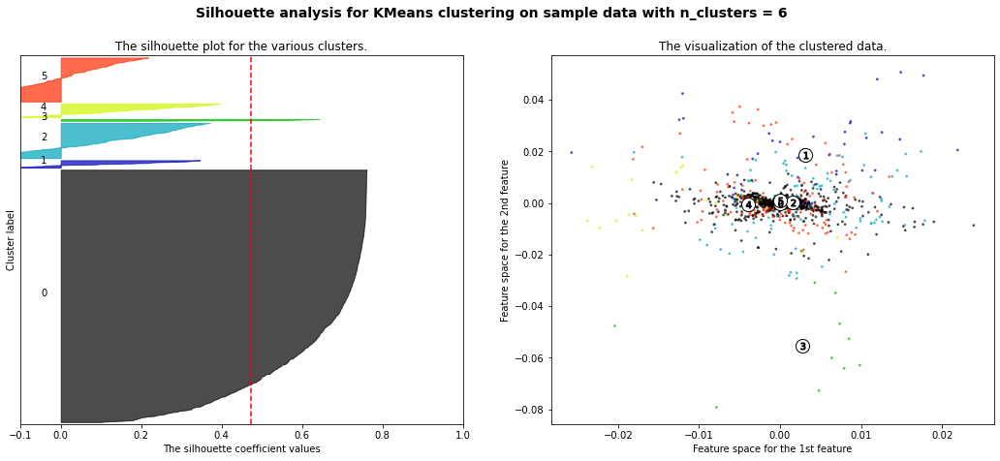

...

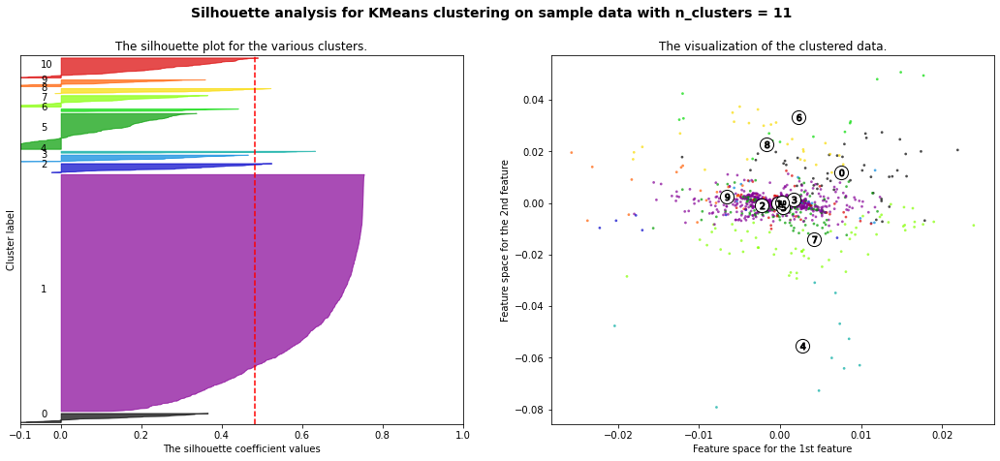

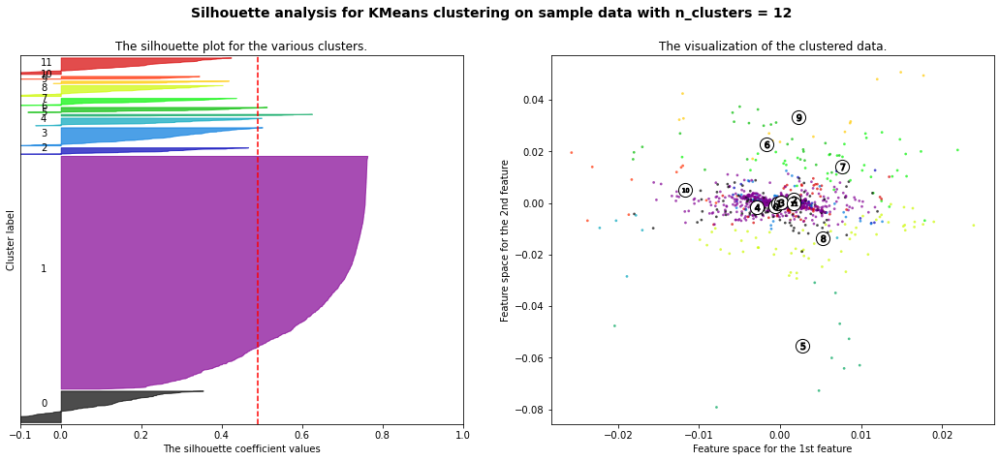

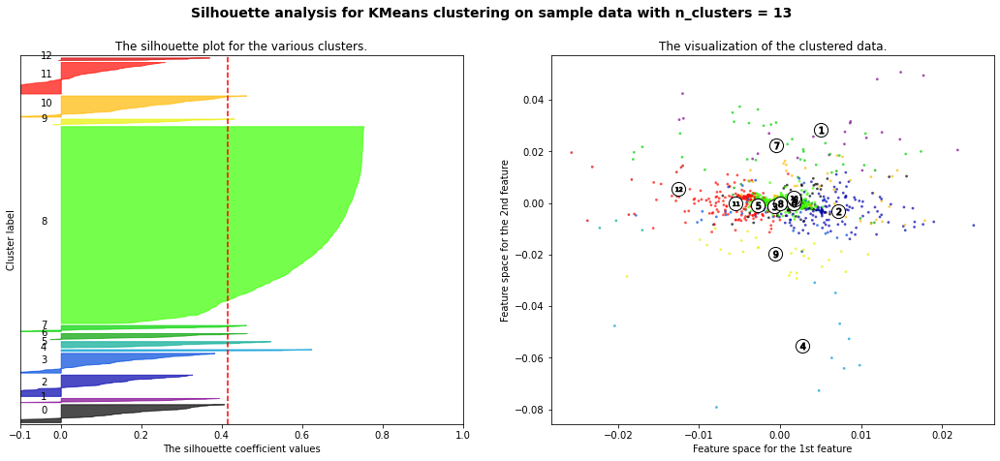

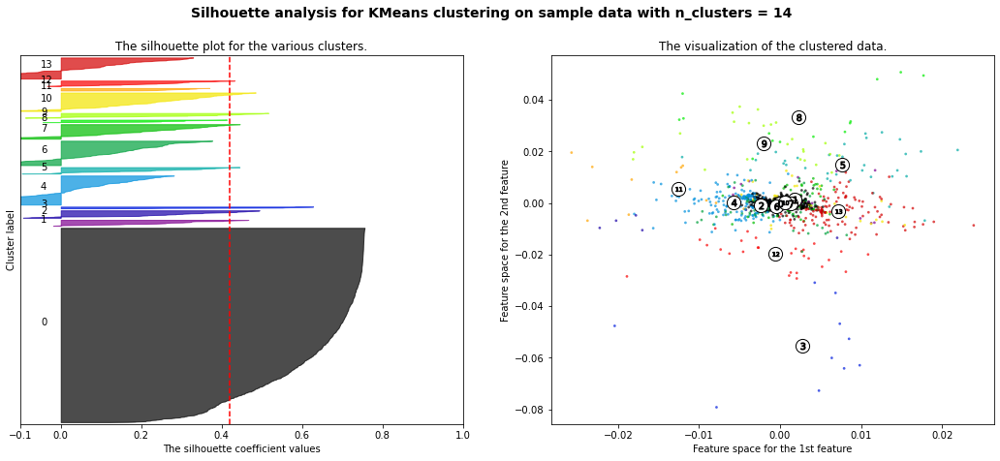

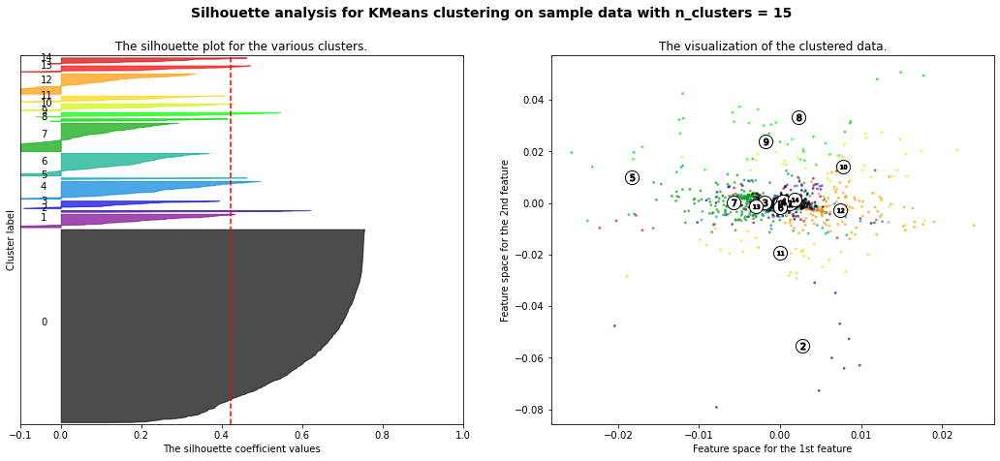

In [47]:
import matplotlib.cm as cm
import numpy as np
from sklearn.datasets import make_blobs

# Set X to array of data
a3_arr = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [2,3,4,5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(a3_arr) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(a3_arr)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(a3_arr, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(a3_arr, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        a3_arr[:, 0], a3_arr[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

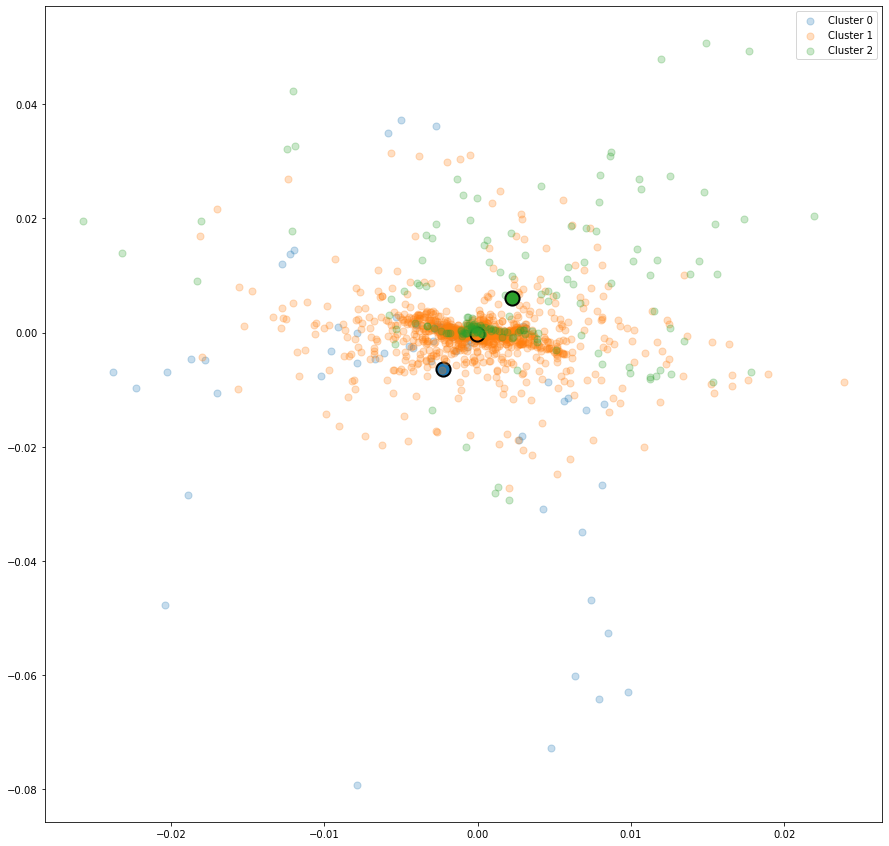

In [48]:
kmeans = KMeans(n_clusters=3).fit(a3_arr)
y_kmeans = kmeans.predict(a3_arr)
centers = kmeans.cluster_centers_
colors = cycle(cm.tab10.colors)
plt.rcParams["figure.figsize"] = (15,15)
for i in range(3):
    color = next(colors)
    idx = y_kmeans == i
    plt.scatter(a3_arr[idx, 0], a3_arr[idx, 1], color=color, s=50, label=f"Cluster {i}", alpha=0.25)  
    plt.scatter(centers[i, 0], centers[i, 1], edgecolors="k", linewidth=2, color=color, s=200, alpha=1)
plt.legend()

## 4. b1_va3

In [50]:
b1 = pd.read_csv('gesture_phase_dataset/b1_va3.csv')
b1

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,Phase
0,0.000194,-0.000442,-0.000110,-0.000206,0.000130,-0.000048,0.000120,-0.000057,-0.000082,-0.000148,...,0.000003,0.000495,0.000249,0.000156,0.000192,0.000018,0.000031,0.000016,0.000025,D
1,0.000254,-0.000530,-0.000124,-0.000151,0.000049,-0.000040,0.000168,-0.000143,-0.000094,-0.000109,...,0.000003,0.000601,0.000164,0.000240,0.000124,0.000040,0.000036,0.000037,0.000028,D
2,0.000276,-0.000513,-0.000116,-0.000070,-0.000056,-0.000024,0.000194,-0.000198,-0.000093,-0.000053,...,0.000004,0.000594,0.000093,0.000292,0.000063,0.000007,0.000034,0.000016,0.000027,D
3,0.000308,-0.000520,-0.000112,-0.000029,-0.000120,-0.000016,0.000230,-0.000253,-0.000098,-0.000023,...,0.000002,0.000615,0.000124,0.000355,0.000082,0.000011,0.000025,0.000022,0.000018,D
4,0.000294,-0.000502,-0.000103,-0.000010,-0.000161,-0.000012,0.000218,-0.000281,-0.000095,-0.000004,...,0.000001,0.000591,0.000162,0.000368,0.000109,0.000007,0.000014,0.000010,0.000011,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,-0.006885,0.004449,0.000280,0.003986,-0.001037,0.000368,-0.005070,0.003117,0.000587,0.004263,...,-0.000074,0.008202,0.004135,0.005980,0.004280,0.003258,0.000200,0.002088,0.000444,D
1065,-0.003735,0.002313,0.000073,0.003580,-0.000496,0.000323,-0.002563,0.001199,0.000208,0.003592,...,-0.000060,0.004394,0.003629,0.002837,0.003617,0.001121,0.000199,0.000935,0.000236,D
1066,-0.001433,0.000635,-0.000163,0.005819,-0.000827,0.000102,-0.000459,-0.000485,-0.000161,0.003519,...,-0.000053,0.001576,0.005878,0.000687,0.003572,0.000841,0.000669,0.000800,0.000087,D
1067,-0.000221,-0.000229,-0.000284,0.006273,-0.001105,-0.000114,0.000610,-0.001036,-0.000304,0.003177,...,-0.000038,0.000426,0.006371,0.001241,0.003238,0.000467,0.000180,0.000379,0.000113,D


In [51]:
b1.rename(columns={'1':'vlhx','2':'vlhy','3':'vlhz','4':'vrhx','5':'vrhy',
                   '6':'vrhz','7':'vlwx','8':'vlwy','9':'vlwz','10':'vrwx',
                   '11':'vrwy','12':'vrwz','13':'alhx','14':'alhy','15':'alhz',
                   '16':'arhx','17':'arhy','18':'arhz','19':'alwx','20':'alwy',
                   '21':'alwz','22':'arwx','23':'arwy','24':'arwz','25':'slh',
                   '26': 'srh','27':'slw','28':'srw','29':'slh2','30':'srh2',
                   '31':'slw2','32':'srw2'}, inplace = True)
b1

,vlhx,vlhy,vlhz,vrhx,vrhy,vrhz,vlwx,vlwy,vlwz,vrwx,...,arwz,slh,srh,slw,srw,slh2,srh2,slw2,srw2,Phase
0,0.000194,-0.000442,-0.000110,-0.000206,0.000130,-0.000048,0.000120,-0.000057,-0.000082,-0.000148,...,0.000003,0.000495,0.000249,0.000156,0.000192,0.000018,0.000031,0.000016,0.000025,D
1,0.000254,-0.000530,-0.000124,-0.000151,0.000049,-0.000040,0.000168,-0.000143,-0.000094,-0.000109,...,0.000003,0.000601,0.000164,0.000240,0.000124,0.000040,0.000036,0.000037,0.000028,D
2,0.000276,-0.000513,-0.000116,-0.000070,-0.000056,-0.000024,0.000194,-0.000198,-0.000093,-0.000053,...,0.000004,0.000594,0.000093,0.000292,0.000063,0.000007,0.000034,0.000016,0.000027,D
3,0.000308,-0.000520,-0.000112,-0.000029,-0.000120,-0.000016,0.000230,-0.000253,-0.000098,-0.000023,...,0.000002,0.000615,0.000124,0.000355,0.000082,0.000011,0.000025,0.000022,0.000018,D
4,0.000294,-0.000502,-0.000103,-0.000010,-0.000161,-0.000012,0.000218,-0.000281,-0.000095,-0.000004,...,0.000001,0.000591,0.000162,0.000368,0.000109,0.000007,0.000014,0.000010,0.000011,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,-0.006885,0.004449,0.000280,0.003986,-0.001037,0.000368,-0.005070,0.003117,0.000587,0.004263,...,-0.000074,0.008202,0.004135,0.005980,0.004280,0.003258,0.000200,0.002088,0.000444,D
1065,-0.003735,0.002313,0.000073,0.003580,-0.000496,0.000323,-0.002563,0.001199,0.000208,0.003592,...,-0.000060,0.004394,0.003629,0.002837,0.003617,0.001121,0.000199,0.000935,0.000236,D
1066,-0.001433,0.000635,-0.000163,0.005819,-0.000827,0.000102,-0.000459,-0.000485,-0.000161,0.003519,...,-0.000053,0.001576,0.005878,0.000687,0.003572,0.000841,0.000669,0.000800,0.000087,D
1067,-0.000221,-0.000229,-0.000284,0.006273,-0.001105,-0.000114,0.000610,-0.001036,-0.000304,0.003177,...,-0.000038,0.000426,0.006371,0.001241,0.003238,0.000467,0.000180,0.000379,0.000113,D


In [52]:
b1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1069 entries, 0 to 1068
Data columns (total 33 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vlhx    1069 non-null   float64
 1   vlhy    1069 non-null   float64
 2   vlhz    1069 non-null   float64
 3   vrhx    1069 non-null   float64
 4   vrhy    1069 non-null   float64
 5   vrhz    1069 non-null   float64
 6   vlwx    1069 non-null   float64
 7   vlwy    1069 non-null   float64
 8   vlwz    1069 non-null   float64
 9   vrwx    1069 non-null   float64
 10  vrwy    1069 non-null   float64
 11  vrwz    1069 non-null   float64
 12  alhx    1069 non-null   float64
 13  alhy    1069 non-null   float64
 14  alhz    1069 non-null   float64
 15  arhx    1069 non-null   float64
 16  arhy    1069 non-null   float64
 17  arhz    1069 non-null   float64
 18  alwx    1069 non-null   float64
 19  alwy    1069 non-null   float64
 20  alwz    1069 non-null   float64
 21  arwx    1069 non-null   float64
 22  

In [53]:
b1['Phase'].value_counts()

P    412
S    287
H    217
R     83
D     70
Name: Phase, dtype: int64

In [54]:
Row_list =[]
  
# Iterate over each row
for index, rows in b1.iterrows():
    # Create list for the current row
    my_list =[rows.vlhx, rows.vlhy, rows.vlhz, 
              rows.vrhx, rows.vrhy, rows.vrhz, 
              rows.vlwx, rows.vlwy, rows.vlwz, 
              rows.vrwx, rows.vrwy, rows.vrwz, 
              rows.alhx, rows.alhy, rows.alhz, 
              rows.arhx, rows.arhy, rows.arhz,
              rows.alwx, rows.alwy, rows.alwz,
              rows.arwx, rows.arwy, rows.arwz,
              rows.slh, rows.srh, rows.slw,
              rows.srw, rows.slh2, rows.srh2,
              rows.slw2, rows.srw2
             ]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[ 1.93940e-04, -4.41950e-04, -1.10010e-04, ...,  3.10800e-05,
         1.55100e-05,  2.53000e-05],
       [ 2.54420e-04, -5.30130e-04, -1.24440e-04, ...,  3.64900e-05,
         3.66300e-05,  2.82500e-05],
       [ 2.76360e-04, -5.12910e-04, -1.15810e-04, ...,  3.42900e-05,
         1.56400e-05,  2.67900e-05],
       ...,
       [-1.43292e-03,  6.35300e-04, -1.63040e-04, ...,  6.68780e-04,
         8.00040e-04,  8.73100e-05],
       [-2.20860e-04, -2.29110e-04, -2.83640e-04, ...,  1.79660e-04,
         3.78580e-04,  1.13480e-04],
       [ 7.55310e-04, -8.98300e-04, -3.73710e-04, ...,  3.88610e-04,
         3.60570e-04,  2.17610e-04]])

For n_clusters = 2 The average silhouette_score is : 0.45806120030042285
For n_clusters = 3 The average silhouette_score is : 0.4441191253597101
For n_clusters = 4 The average silhouette_score is : 0.4510577815355074
For n_clusters = 5 The average silhouette_score is : 0.4106538870684054
For n_clusters = 6 The average silhouette_score is : 0.38550007277329335
For n_clusters = 7 The average silhouette_score is : 0.324231177257365
For n_clusters = 8 The average silhouette_score is : 0.34397337635278524
For n_clusters = 9 The average silhouette_score is : 0.30050677318318947
For n_clusters = 10 The average silhouette_score is : 0.32155072985726185
For n_clusters = 11 The average silhouette_score is : 0.3363468731349479
For n_clusters = 12 The average silhouette_score is : 0.3304206089701906
For n_clusters = 13 The average silhouette_score is : 0.33435434273935155
For n_clusters = 14 The average silhouette_score is : 0.33176920025124146
For n_clusters = 15 The average silhouette_score is :

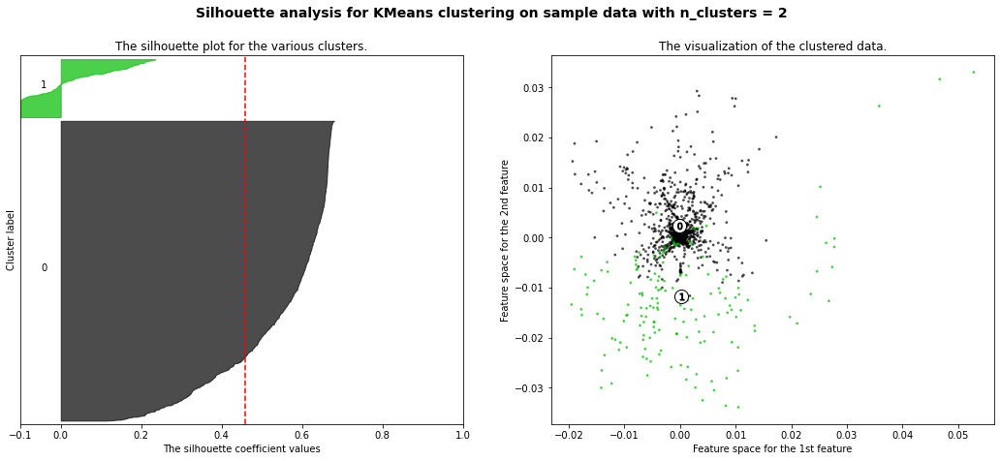

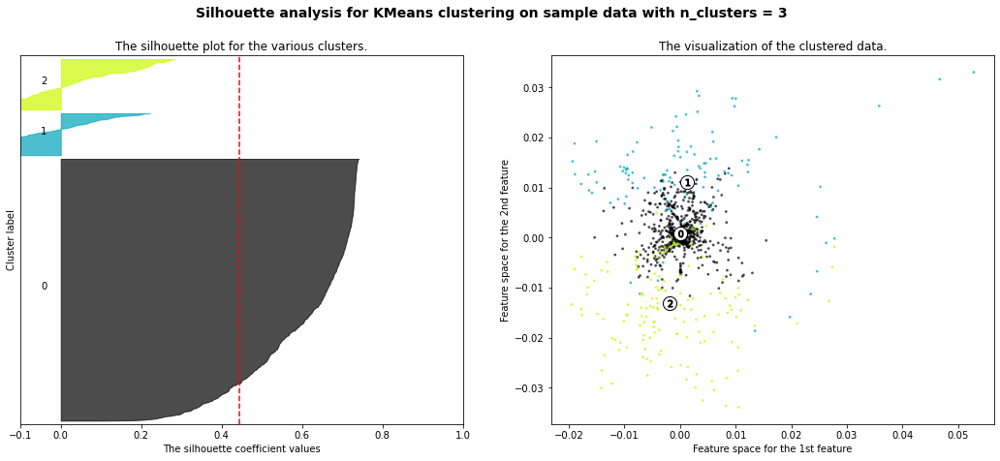

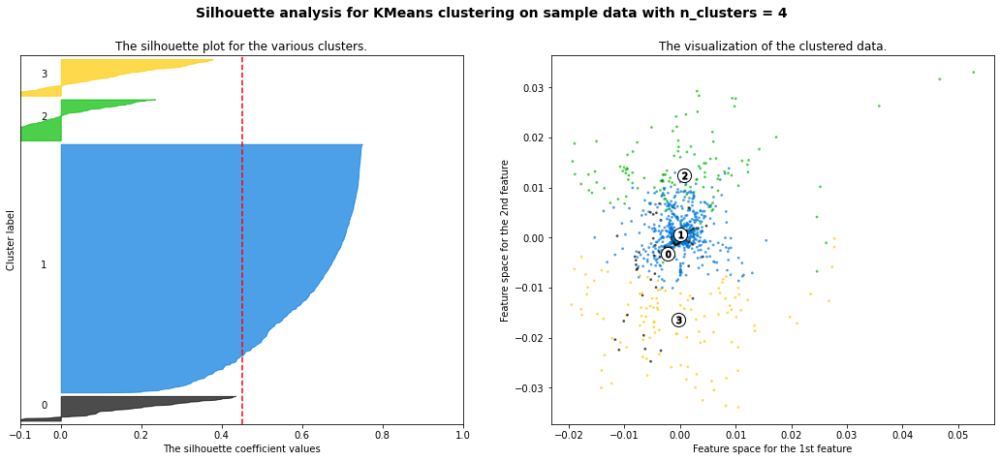

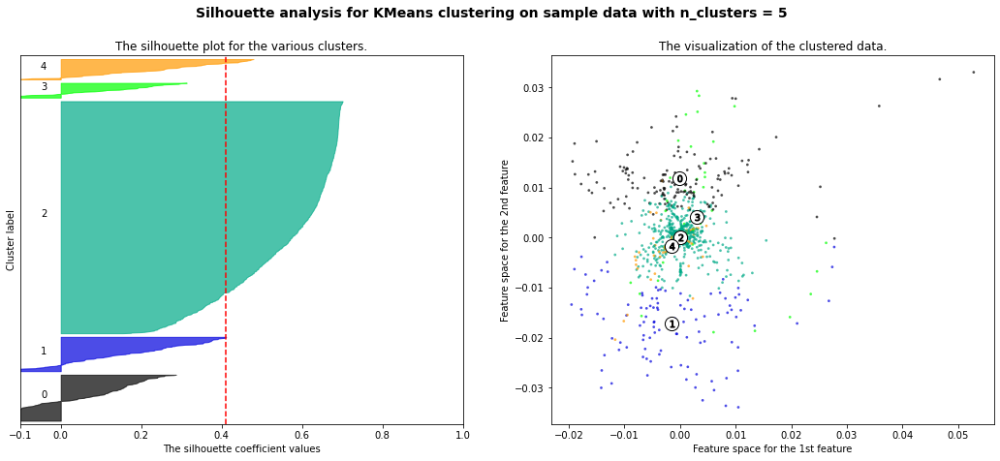

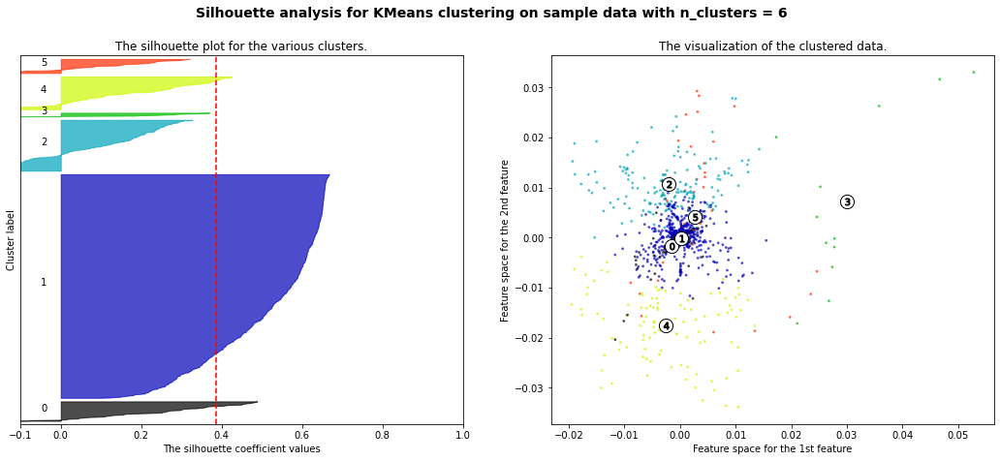

...

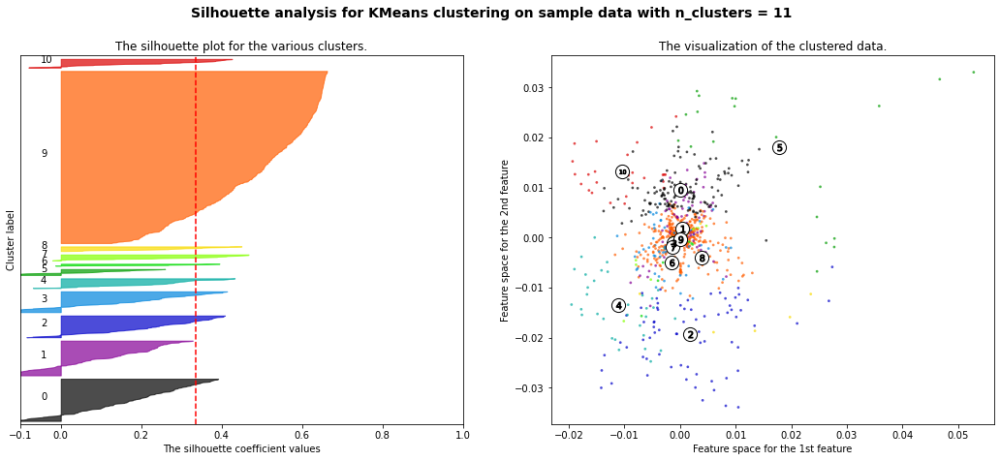

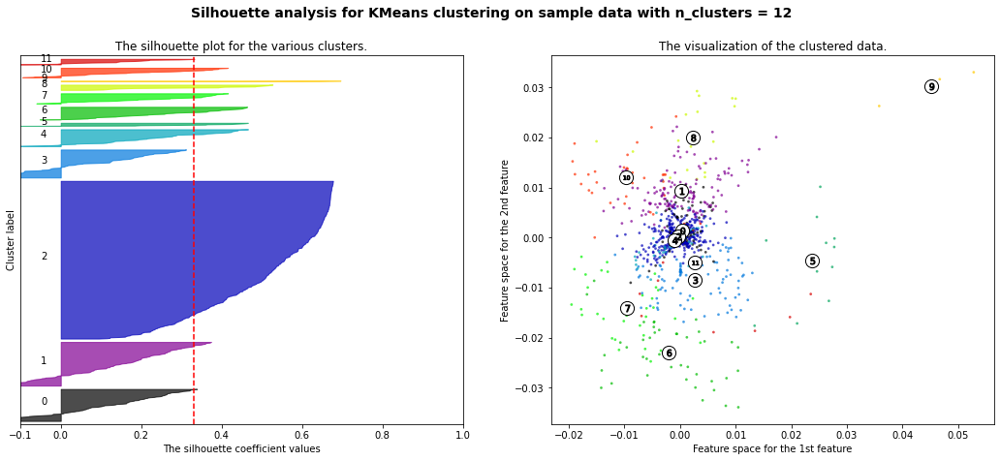

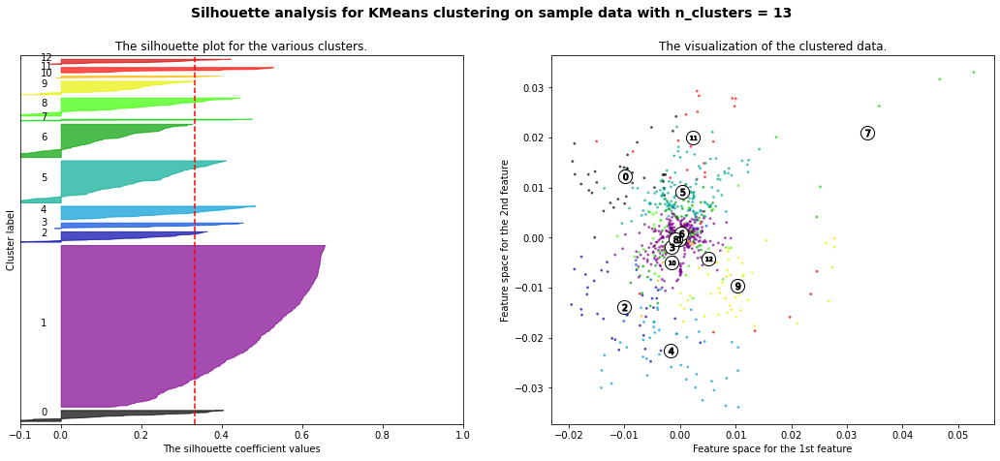

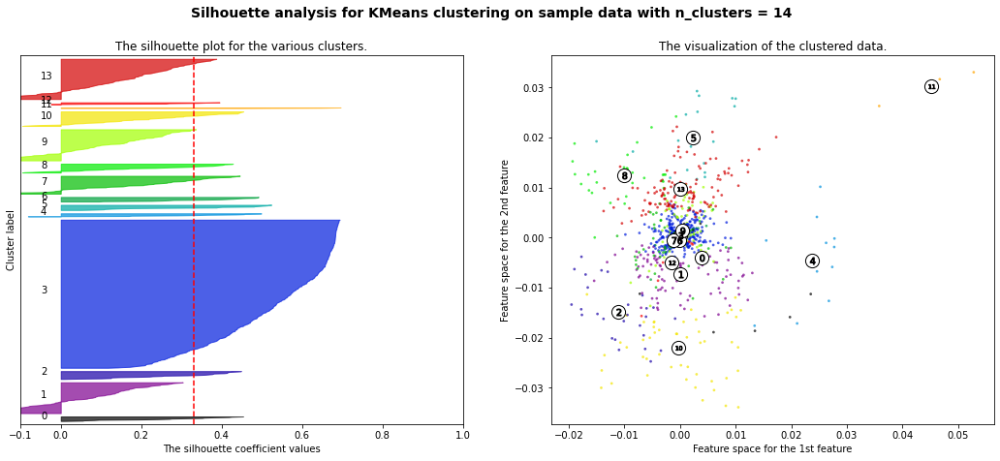

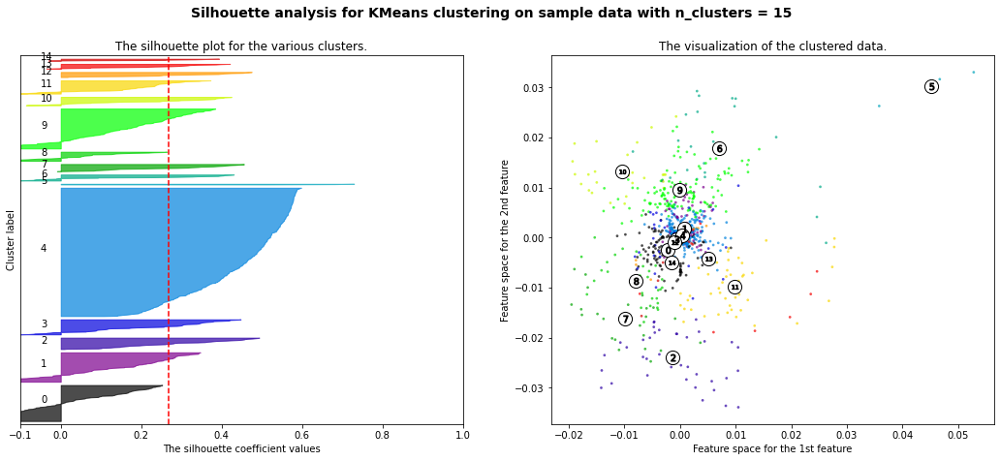

In [57]:
import matplotlib.cm as cm
import numpy as np
from sklearn.datasets import make_blobs

# Set X to array of data
b1_arr = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [2,3,4,5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(b1_arr) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(b1_arr)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(b1_arr, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(b1_arr, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        b1_arr[:, 0], b1_arr[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

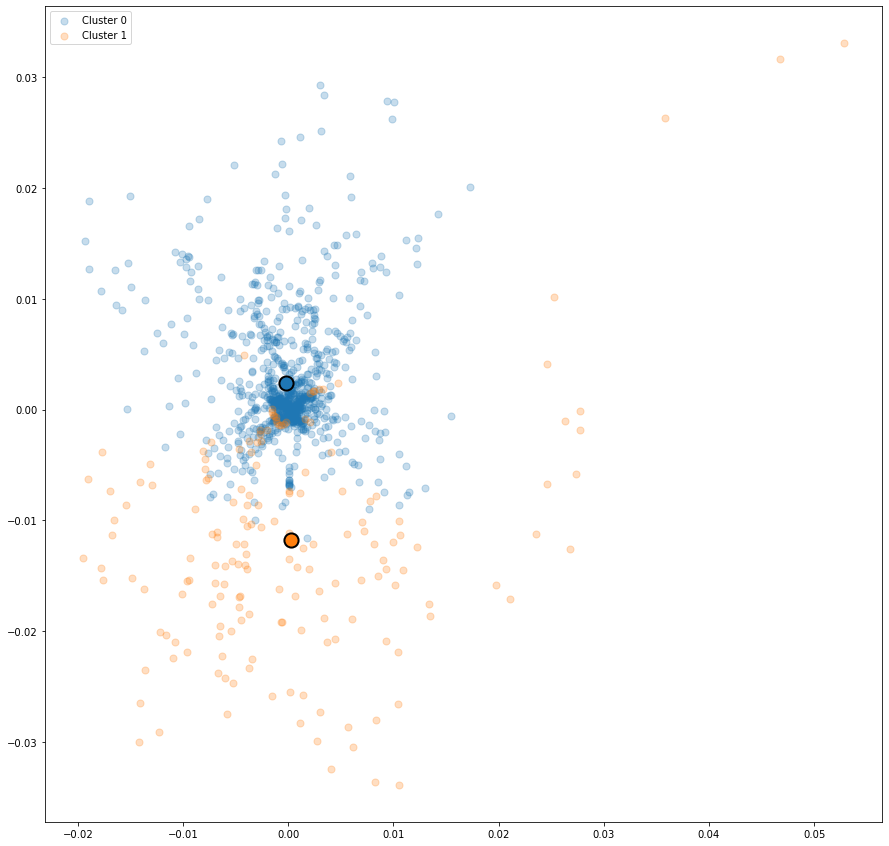

In [58]:
kmeans = KMeans(n_clusters=2).fit(b1_arr)
y_kmeans = kmeans.predict(b1_arr)
centers = kmeans.cluster_centers_
colors = cycle(cm.tab10.colors)
plt.rcParams["figure.figsize"] = (15,15)
for i in range(2):
    color = next(colors)
    idx = y_kmeans == i
    plt.scatter(b1_arr[idx, 0], b1_arr[idx, 1], color=color, s=50, label=f"Cluster {i}", alpha=0.25)  
    plt.scatter(centers[i, 0], centers[i, 1], edgecolors="k", linewidth=2, color=color, s=200, alpha=1)
plt.legend()

## 5. b3_raw

In [59]:
b3 = pd.read_csv('gesture_phase_dataset/b3_va3.csv')
b3

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,Phase
0,-0.000332,0.000262,0.000866,-0.000231,-0.000124,-0.000551,-0.000320,0.000854,0.001547,-0.000075,...,0.000026,0.000964,0.000611,0.001795,0.000203,0.000238,0.000147,0.000061,0.000026,D
1,0.000551,-0.000415,-0.002184,-0.000137,-0.000143,-0.000280,-0.000581,0.000632,0.003374,-0.000063,...,0.000014,0.002290,0.000343,0.003481,0.000158,0.000984,0.000087,0.000563,0.000035,D
2,0.000069,-0.000327,-0.001134,0.000018,-0.000083,0.000055,-0.000579,0.000430,0.003996,-0.000040,...,0.000025,0.001182,0.000101,0.004061,0.000267,0.000322,0.000104,0.000182,0.000063,D
3,-0.000092,-0.000294,-0.000287,0.000121,-0.000050,0.000195,-0.000507,0.000128,0.003216,-0.000030,...,0.000004,0.000421,0.000234,0.003258,0.000320,0.000269,0.000055,0.000262,0.000023,D
4,-0.000780,0.000197,0.002274,0.000165,0.000032,0.000341,0.001153,-0.000440,-0.006310,0.000015,...,0.000017,0.002412,0.000380,0.006429,0.000304,0.000843,0.000054,0.003027,0.000044,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1415,0.010333,-0.002038,-0.008912,0.000109,0.002904,0.004225,0.007557,-0.000813,-0.005981,-0.000287,...,-0.000259,0.013796,0.005128,0.009671,0.003493,0.001873,0.000565,0.001658,0.000501,D
1416,0.010099,0.001105,-0.011759,0.000360,0.002882,0.004121,0.007941,0.001411,-0.010443,-0.000250,...,-0.000036,0.015540,0.005042,0.013195,0.003202,0.001287,0.000082,0.001515,0.000090,D
1417,0.008530,0.002941,-0.012576,0.001232,0.005888,0.004819,0.006877,0.003143,-0.010961,0.000979,...,0.000323,0.015478,0.007708,0.013316,0.006376,0.000708,0.000891,0.000583,0.000940,D
1418,0.008129,0.004434,-0.013898,0.001296,0.006230,0.004084,0.009069,0.006566,-0.011762,0.001254,...,0.000057,0.016700,0.007562,0.016239,0.006885,0.000636,0.000254,0.001295,0.000171,D


In [61]:
b3.rename(columns={'1':'vlhx','2':'vlhy','3':'vlhz','4':'vrhx','5':'vrhy',
                   '6':'vrhz','7':'vlwx','8':'vlwy','9':'vlwz','10':'vrwx',
                   '11':'vrwy','12':'vrwz','13':'alhx','14':'alhy','15':'alhz',
                   '16':'arhx','17':'arhy','18':'arhz','19':'alwx','20':'alwy',
                   '21':'alwz','22':'arwx','23':'arwy','24':'arwz','25':'slh',
                   '26': 'srh','27':'slw','28':'srw','29':'slh2','30':'srh2',
                   '31':'slw2','32':'srw2'}, inplace = True)
b3

,vlhx,vlhy,vlhz,vrhx,vrhy,vrhz,vlwx,vlwy,vlwz,vrwx,...,arwz,slh,srh,slw,srw,slh2,srh2,slw2,srw2,Phase
0,-0.000332,0.000262,0.000866,-0.000231,-0.000124,-0.000551,-0.000320,0.000854,0.001547,-0.000075,...,0.000026,0.000964,0.000611,0.001795,0.000203,0.000238,0.000147,0.000061,0.000026,D
1,0.000551,-0.000415,-0.002184,-0.000137,-0.000143,-0.000280,-0.000581,0.000632,0.003374,-0.000063,...,0.000014,0.002290,0.000343,0.003481,0.000158,0.000984,0.000087,0.000563,0.000035,D
2,0.000069,-0.000327,-0.001134,0.000018,-0.000083,0.000055,-0.000579,0.000430,0.003996,-0.000040,...,0.000025,0.001182,0.000101,0.004061,0.000267,0.000322,0.000104,0.000182,0.000063,D
3,-0.000092,-0.000294,-0.000287,0.000121,-0.000050,0.000195,-0.000507,0.000128,0.003216,-0.000030,...,0.000004,0.000421,0.000234,0.003258,0.000320,0.000269,0.000055,0.000262,0.000023,D
4,-0.000780,0.000197,0.002274,0.000165,0.000032,0.000341,0.001153,-0.000440,-0.006310,0.000015,...,0.000017,0.002412,0.000380,0.006429,0.000304,0.000843,0.000054,0.003027,0.000044,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1415,0.010333,-0.002038,-0.008912,0.000109,0.002904,0.004225,0.007557,-0.000813,-0.005981,-0.000287,...,-0.000259,0.013796,0.005128,0.009671,0.003493,0.001873,0.000565,0.001658,0.000501,D
1416,0.010099,0.001105,-0.011759,0.000360,0.002882,0.004121,0.007941,0.001411,-0.010443,-0.000250,...,-0.000036,0.015540,0.005042,0.013195,0.003202,0.001287,0.000082,0.001515,0.000090,D
1417,0.008530,0.002941,-0.012576,0.001232,0.005888,0.004819,0.006877,0.003143,-0.010961,0.000979,...,0.000323,0.015478,0.007708,0.013316,0.006376,0.000708,0.000891,0.000583,0.000940,D
1418,0.008129,0.004434,-0.013898,0.001296,0.006230,0.004084,0.009069,0.006566,-0.011762,0.001254,...,0.000057,0.016700,0.007562,0.016239,0.006885,0.000636,0.000254,0.001295,0.000171,D


In [62]:
b3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1420 entries, 0 to 1419
Data columns (total 33 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vlhx    1420 non-null   float64
 1   vlhy    1420 non-null   float64
 2   vlhz    1420 non-null   float64
 3   vrhx    1420 non-null   float64
 4   vrhy    1420 non-null   float64
 5   vrhz    1420 non-null   float64
 6   vlwx    1420 non-null   float64
 7   vlwy    1420 non-null   float64
 8   vlwz    1420 non-null   float64
 9   vrwx    1420 non-null   float64
 10  vrwy    1420 non-null   float64
 11  vrwz    1420 non-null   float64
 12  alhx    1420 non-null   float64
 13  alhy    1420 non-null   float64
 14  alhz    1420 non-null   float64
 15  arhx    1420 non-null   float64
 16  arhy    1420 non-null   float64
 17  arhz    1420 non-null   float64
 18  alwx    1420 non-null   float64
 19  alwy    1420 non-null   float64
 20  alwz    1420 non-null   float64
 21  arwx    1420 non-null   float64
 22  

In [63]:
b3['Phase'].value_counts()

P    469
S    390
H    201
D    190
R    170
Name: Phase, dtype: int64

In [64]:
Row_list =[]
  
# Iterate over each row
for index, rows in b3.iterrows():
    # Create list for the current row
    my_list =[rows.vlhx, rows.vlhy, rows.vlhz, 
              rows.vrhx, rows.vrhy, rows.vrhz, 
              rows.vlwx, rows.vlwy, rows.vlwz, 
              rows.vrwx, rows.vrwy, rows.vrwz, 
              rows.alhx, rows.alhy, rows.alhz, 
              rows.arhx, rows.arhy, rows.arhz,
              rows.alwx, rows.alwy, rows.alwz,
              rows.arwx, rows.arwy, rows.arwz,
              rows.slh, rows.srh, rows.slw,
              rows.srw, rows.slh2, rows.srh2,
              rows.slw2, rows.srw2
             ]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[-3.324100e-04,  2.617300e-04,  8.658100e-04, ...,  1.469700e-04,
         6.092000e-05,  2.630000e-05],
       [ 5.511600e-04, -4.146800e-04, -2.183880e-03, ...,  8.734000e-05,
         5.633300e-04,  3.531000e-05],
       [ 6.879000e-05, -3.265200e-04, -1.133530e-03, ...,  1.039000e-04,
         1.817000e-04,  6.322000e-05],
       ...,
       [ 8.530310e-03,  2.940670e-03, -1.257556e-02, ...,  8.909700e-04,
         5.829600e-04,  9.403800e-04],
       [ 8.129020e-03,  4.433620e-03, -1.389757e-02, ...,  2.541700e-04,
         1.294530e-03,  1.706800e-04],
       [ 5.732850e-03,  3.122660e-03, -1.416860e-02, ...,  1.854400e-03,
         8.986800e-04,  2.541410e-03]])

For n_clusters = 2 The average silhouette_score is : 0.3202616828047294
For n_clusters = 3 The average silhouette_score is : 0.32934032088543036
For n_clusters = 4 The average silhouette_score is : 0.3324388667434539
For n_clusters = 5 The average silhouette_score is : 0.33989332455241095
For n_clusters = 6 The average silhouette_score is : 0.34020032391950733
For n_clusters = 7 The average silhouette_score is : 0.3454153821629369
For n_clusters = 8 The average silhouette_score is : 0.25128944000921205
For n_clusters = 9 The average silhouette_score is : 0.2572523246080377
For n_clusters = 10 The average silhouette_score is : 0.25602354162268165
For n_clusters = 11 The average silhouette_score is : 0.24404229447066875
For n_clusters = 12 The average silhouette_score is : 0.23168766299427057
For n_clusters = 13 The average silhouette_score is : 0.2144449807160895
For n_clusters = 14 The average silhouette_score is : 0.2380888261863329
For n_clusters = 15 The average silhouette_score is 

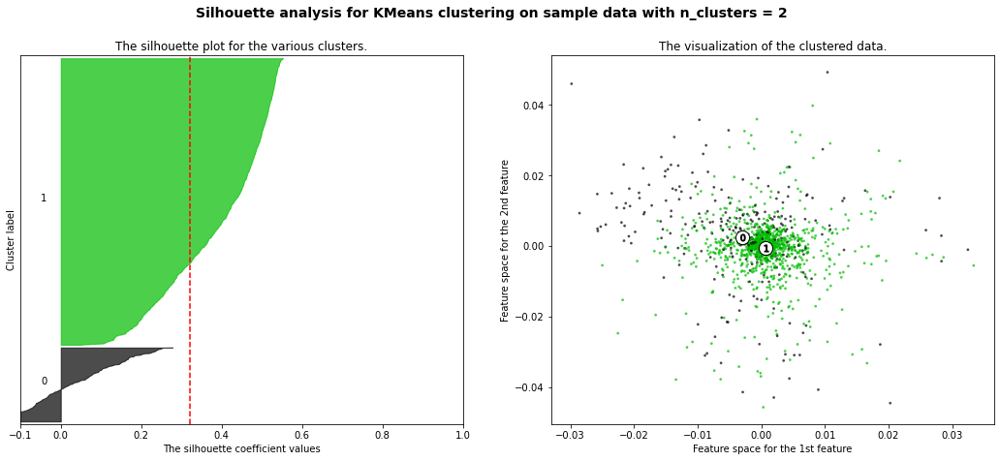

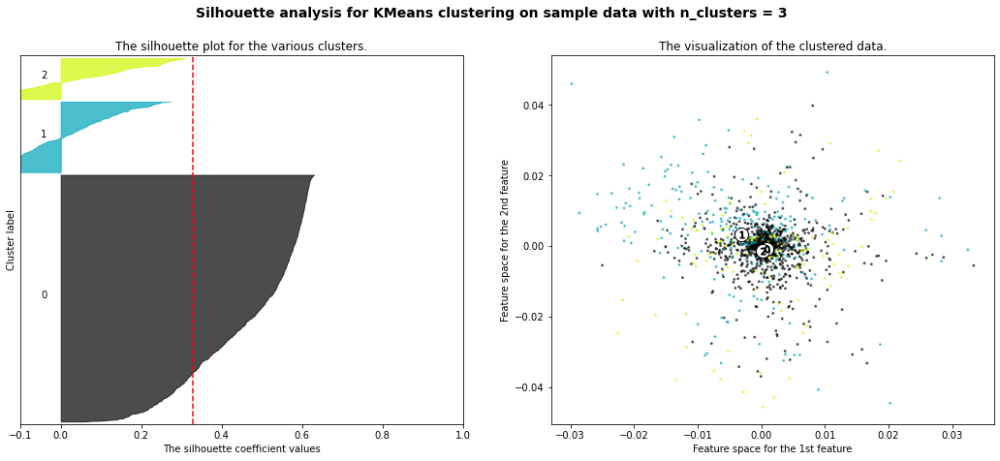

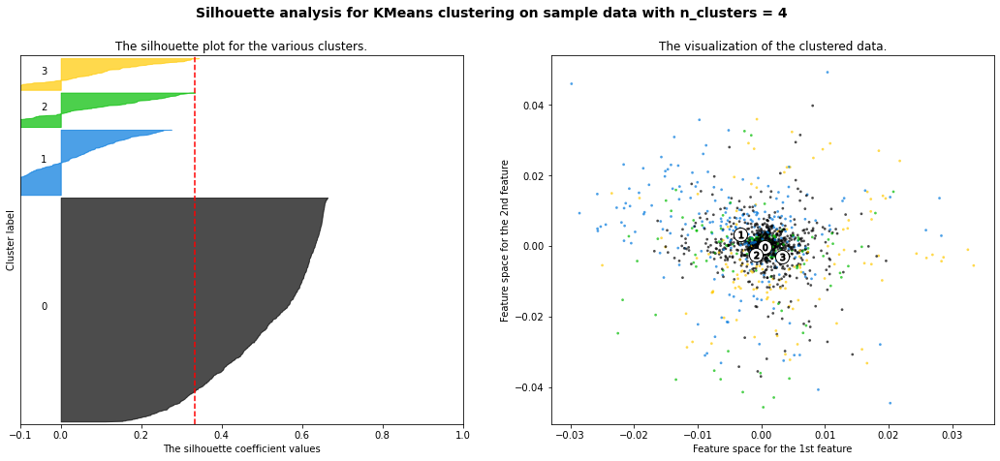

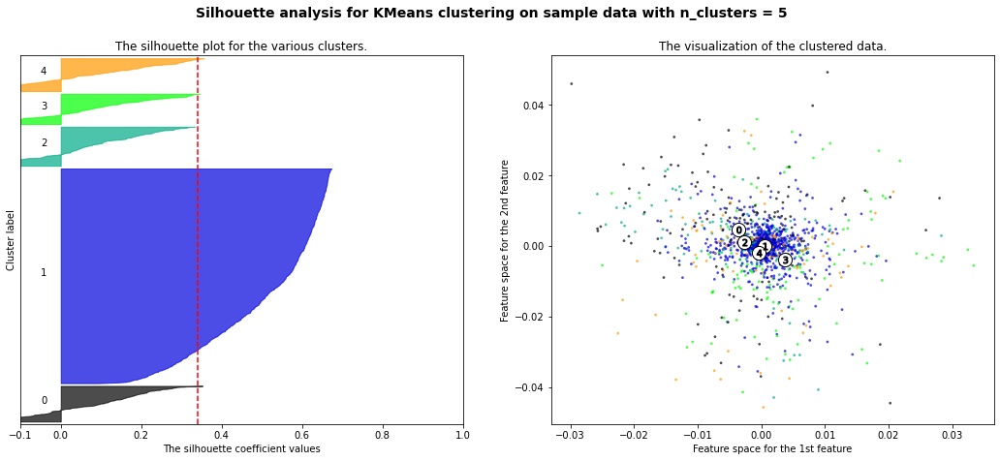

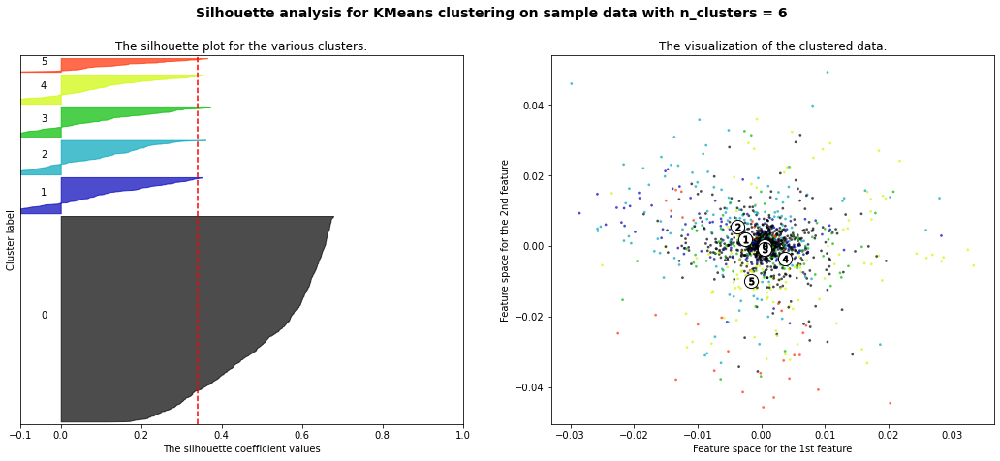

...

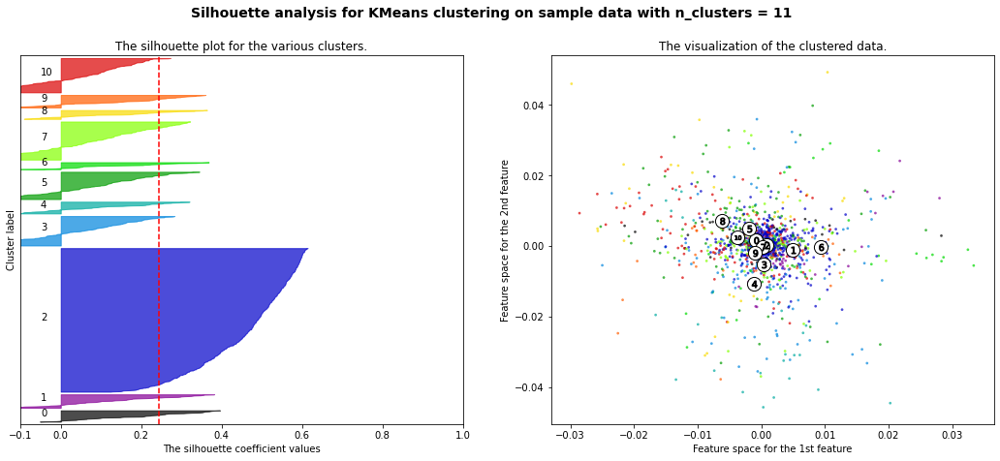

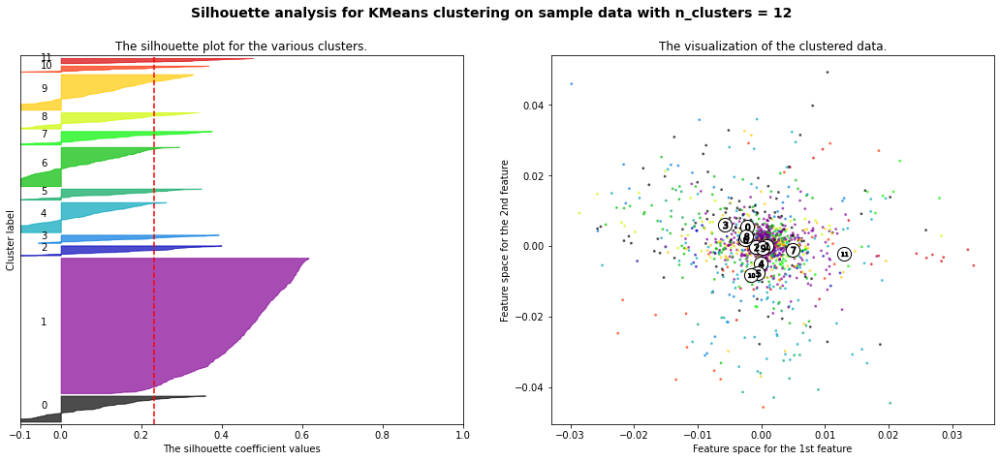

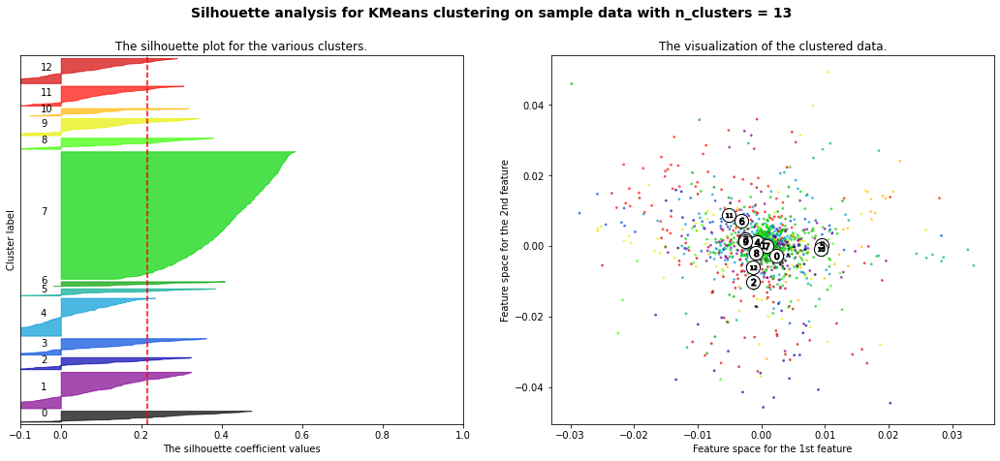

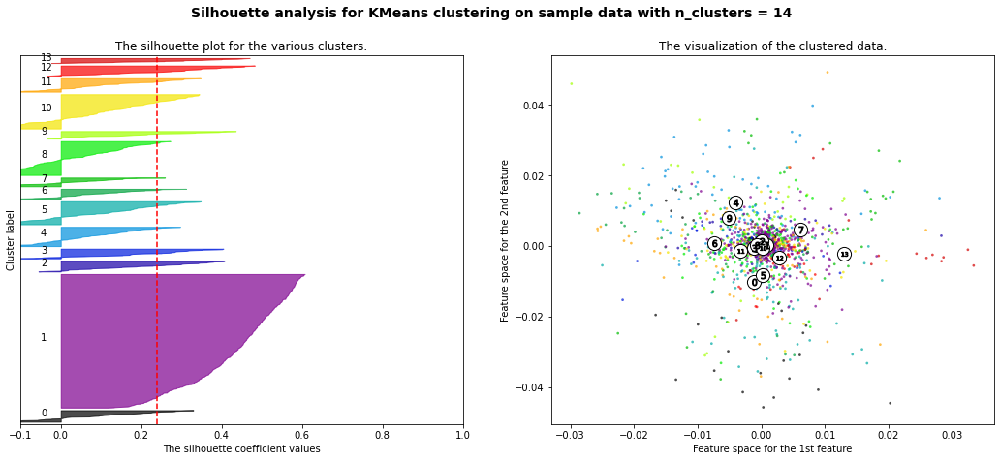

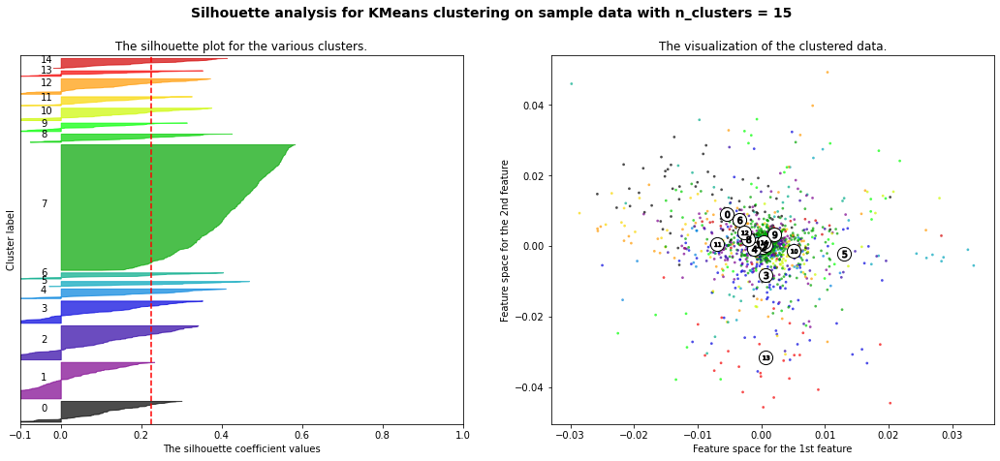

In [66]:
import matplotlib.cm as cm
import numpy as np
from sklearn.datasets import make_blobs

# Set X to array of data
b3_arr = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [2,3,4,5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(b3_arr) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(b3_arr)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(b3_arr, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(b3_arr, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        b3_arr[:, 0], b3_arr[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

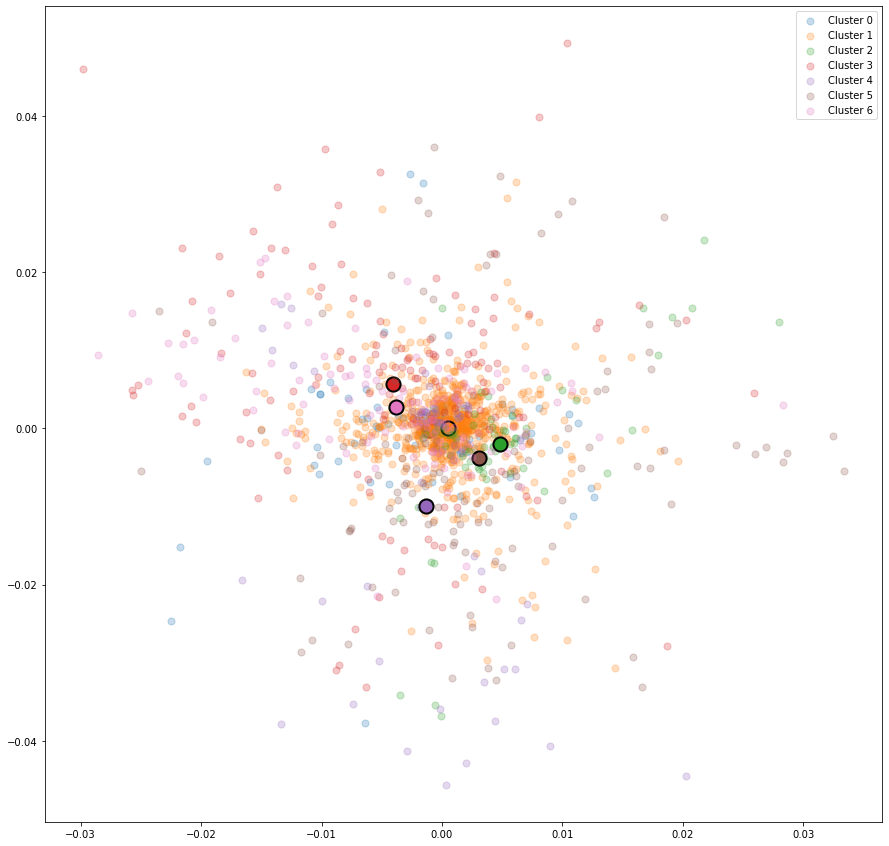

In [67]:
kmeans = KMeans(n_clusters=7).fit(b3_arr)
y_kmeans = kmeans.predict(b3_arr)
centers = kmeans.cluster_centers_
colors = cycle(cm.tab10.colors)
plt.rcParams["figure.figsize"] = (15,15)
for i in range(7):
    color = next(colors)
    idx = y_kmeans == i
    plt.scatter(b3_arr[idx, 0], b3_arr[idx, 1], color=color, s=50, label=f"Cluster {i}", alpha=0.25)  
    plt.scatter(centers[i, 0], centers[i, 1], edgecolors="k", linewidth=2, color=color, s=200, alpha=1)
plt.legend()

## 6. c1_va3

In [68]:
c1 = pd.read_csv('gesture_phase_dataset/c1_va3.csv')
c1

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,Phase
0,0.000036,-0.000024,0.000007,-0.000237,-0.000109,-0.000013,0.000037,-0.000022,0.000006,-0.000237,...,-0.000011,0.000044,0.000261,0.000043,0.000260,0.000024,0.000080,0.000025,0.000080,D
1,0.000084,-0.000054,0.000008,0.000094,-0.000006,0.000010,0.000086,-0.000048,0.000007,0.000094,...,0.000011,0.000100,0.000094,0.000099,0.000094,0.000026,0.000158,0.000025,0.000158,D
2,0.000932,0.001428,-0.000172,0.000283,0.000106,0.000033,0.000900,0.000991,-0.000127,0.000283,...,0.000007,0.001714,0.000304,0.001344,0.000306,0.000554,0.000071,0.000428,0.000071,D
3,0.000579,0.000936,-0.000078,0.000228,0.000074,0.000023,0.000580,0.000933,-0.000078,0.000228,...,-0.000002,0.001103,0.000241,0.001101,0.000242,0.000130,0.000014,0.000070,0.000014,D
4,0.000507,0.000940,-0.000053,0.000170,0.000066,0.000011,0.000495,0.000789,-0.000037,0.000170,...,-0.000008,0.001070,0.000183,0.000932,0.000184,0.000047,0.000037,0.000108,0.000037,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1102,-0.002300,0.001083,0.000383,-0.010458,0.000700,-0.001335,-0.003633,0.001226,0.000258,-0.009837,...,-0.000360,0.002570,0.010566,0.003843,0.009978,0.000255,0.004176,0.000491,0.002301,D
1103,-0.011050,-0.004633,0.000410,-0.000704,0.000324,-0.000151,-0.003944,0.001107,0.000110,-0.001171,...,0.000450,0.011989,0.000790,0.004098,0.001397,0.003371,0.003172,0.000117,0.002865,D
1104,-0.005574,-0.001454,-0.000014,0.002805,-0.003044,0.001212,-0.000504,-0.000031,-0.000089,0.007213,...,0.000474,0.005760,0.004313,0.000512,0.008440,0.002047,0.001629,0.001171,0.002961,D
1105,-0.004457,-0.000867,-0.000263,-0.007456,-0.000335,-0.000316,0.001707,-0.000632,-0.000264,-0.002253,...,-0.000479,0.004548,0.007470,0.001840,0.002666,0.000415,0.003459,0.000741,0.003218,D


In [69]:
c1.rename(columns={'1':'vlhx','2':'vlhy','3':'vlhz','4':'vrhx','5':'vrhy',
                   '6':'vrhz','7':'vlwx','8':'vlwy','9':'vlwz','10':'vrwx',
                   '11':'vrwy','12':'vrwz','13':'alhx','14':'alhy','15':'alhz',
                   '16':'arhx','17':'arhy','18':'arhz','19':'alwx','20':'alwy',
                   '21':'alwz','22':'arwx','23':'arwy','24':'arwz','25':'slh',
                   '26': 'srh','27':'slw','28':'srw','29':'slh2','30':'srh2',
                   '31':'slw2','32':'srw2'}, inplace = True)
c1

,vlhx,vlhy,vlhz,vrhx,vrhy,vrhz,vlwx,vlwy,vlwz,vrwx,...,arwz,slh,srh,slw,srw,slh2,srh2,slw2,srw2,Phase
0,0.000036,-0.000024,0.000007,-0.000237,-0.000109,-0.000013,0.000037,-0.000022,0.000006,-0.000237,...,-0.000011,0.000044,0.000261,0.000043,0.000260,0.000024,0.000080,0.000025,0.000080,D
1,0.000084,-0.000054,0.000008,0.000094,-0.000006,0.000010,0.000086,-0.000048,0.000007,0.000094,...,0.000011,0.000100,0.000094,0.000099,0.000094,0.000026,0.000158,0.000025,0.000158,D
2,0.000932,0.001428,-0.000172,0.000283,0.000106,0.000033,0.000900,0.000991,-0.000127,0.000283,...,0.000007,0.001714,0.000304,0.001344,0.000306,0.000554,0.000071,0.000428,0.000071,D
3,0.000579,0.000936,-0.000078,0.000228,0.000074,0.000023,0.000580,0.000933,-0.000078,0.000228,...,-0.000002,0.001103,0.000241,0.001101,0.000242,0.000130,0.000014,0.000070,0.000014,D
4,0.000507,0.000940,-0.000053,0.000170,0.000066,0.000011,0.000495,0.000789,-0.000037,0.000170,...,-0.000008,0.001070,0.000183,0.000932,0.000184,0.000047,0.000037,0.000108,0.000037,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1102,-0.002300,0.001083,0.000383,-0.010458,0.000700,-0.001335,-0.003633,0.001226,0.000258,-0.009837,...,-0.000360,0.002570,0.010566,0.003843,0.009978,0.000255,0.004176,0.000491,0.002301,D
1103,-0.011050,-0.004633,0.000410,-0.000704,0.000324,-0.000151,-0.003944,0.001107,0.000110,-0.001171,...,0.000450,0.011989,0.000790,0.004098,0.001397,0.003371,0.003172,0.000117,0.002865,D
1104,-0.005574,-0.001454,-0.000014,0.002805,-0.003044,0.001212,-0.000504,-0.000031,-0.000089,0.007213,...,0.000474,0.005760,0.004313,0.000512,0.008440,0.002047,0.001629,0.001171,0.002961,D
1105,-0.004457,-0.000867,-0.000263,-0.007456,-0.000335,-0.000316,0.001707,-0.000632,-0.000264,-0.002253,...,-0.000479,0.004548,0.007470,0.001840,0.002666,0.000415,0.003459,0.000741,0.003218,D


In [70]:
c1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1107 entries, 0 to 1106
Data columns (total 33 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vlhx    1107 non-null   float64
 1   vlhy    1107 non-null   float64
 2   vlhz    1107 non-null   float64
 3   vrhx    1107 non-null   float64
 4   vrhy    1107 non-null   float64
 5   vrhz    1107 non-null   float64
 6   vlwx    1107 non-null   float64
 7   vlwy    1107 non-null   float64
 8   vlwz    1107 non-null   float64
 9   vrwx    1107 non-null   float64
 10  vrwy    1107 non-null   float64
 11  vrwz    1107 non-null   float64
 12  alhx    1107 non-null   float64
 13  alhy    1107 non-null   float64
 14  alhz    1107 non-null   float64
 15  arhx    1107 non-null   float64
 16  arhy    1107 non-null   float64
 17  arhz    1107 non-null   float64
 18  alwx    1107 non-null   float64
 19  alwy    1107 non-null   float64
 20  alwz    1107 non-null   float64
 21  arwx    1107 non-null   float64
 22  

In [71]:
c1['Phase'].value_counts()

D    282
S    262
P    236
H    193
R    134
Name: Phase, dtype: int64

In [72]:
Row_list =[]
  
# Iterate over each row
for index, rows in c1.iterrows():
    # Create list for the current row
    my_list =[rows.vlhx, rows.vlhy, rows.vlhz, 
              rows.vrhx, rows.vrhy, rows.vrhz, 
              rows.vlwx, rows.vlwy, rows.vlwz, 
              rows.vrwx, rows.vrwy, rows.vrwz, 
              rows.alhx, rows.alhy, rows.alhz, 
              rows.arhx, rows.arhy, rows.arhz,
              rows.alwx, rows.alwy, rows.alwz,
              rows.arwx, rows.arwy, rows.arwz,
              rows.slh, rows.srh, rows.slw,
              rows.srw, rows.slh2, rows.srh2,
              rows.slw2, rows.srw2
             ]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[ 3.62000e-05, -2.41700e-05,  6.64000e-06, ...,  7.96600e-05,
         2.51300e-05,  7.97000e-05],
       [ 8.43800e-05, -5.38800e-05,  8.19000e-06, ...,  1.57770e-04,
         2.54200e-05,  1.58250e-04],
       [ 9.32390e-04,  1.42781e-03, -1.72020e-04, ...,  7.14000e-05,
         4.27800e-04,  7.13900e-05],
       ...,
       [-5.57351e-03, -1.45361e-03, -1.44800e-05, ...,  1.62939e-03,
         1.17072e-03,  2.96141e-03],
       [-4.45650e-03, -8.67270e-04, -2.63230e-04, ...,  3.45851e-03,
         7.41290e-04,  3.21757e-03],
       [ 8.03123e-03,  4.87478e-03, -6.73490e-04, ...,  7.00800e-05,
         2.11890e-04,  2.81770e-04]])

For n_clusters = 2 The average silhouette_score is : 0.47004470398733744
For n_clusters = 3 The average silhouette_score is : 0.4393022564028914
For n_clusters = 4 The average silhouette_score is : 0.44533086302177133
For n_clusters = 5 The average silhouette_score is : 0.36936985188106597
For n_clusters = 6 The average silhouette_score is : 0.3260908721351362
For n_clusters = 7 The average silhouette_score is : 0.3131846215547661
For n_clusters = 8 The average silhouette_score is : 0.334715808764448
For n_clusters = 9 The average silhouette_score is : 0.3161591669450515
For n_clusters = 10 The average silhouette_score is : 0.33023144116761927
For n_clusters = 11 The average silhouette_score is : 0.3085723219796841
For n_clusters = 12 The average silhouette_score is : 0.31983851822451154
For n_clusters = 13 The average silhouette_score is : 0.29643845303599675
For n_clusters = 14 The average silhouette_score is : 0.30494337290059287
For n_clusters = 15 The average silhouette_score is :

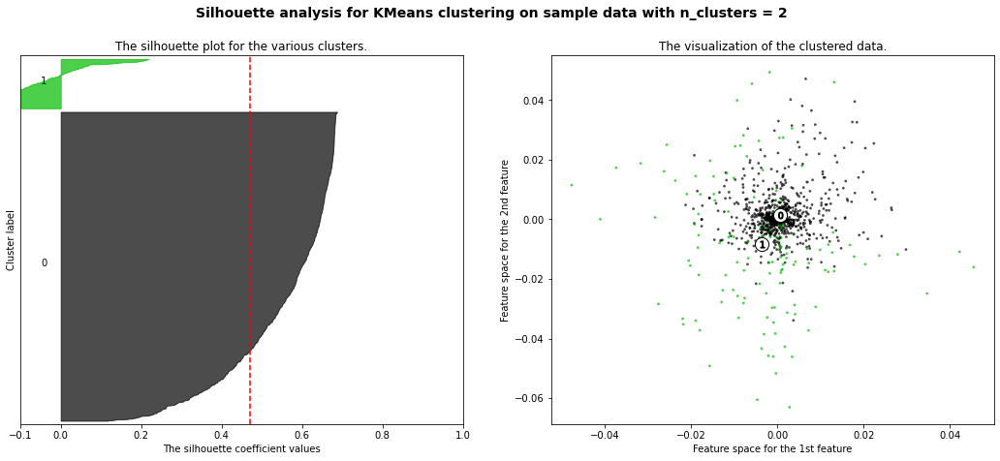

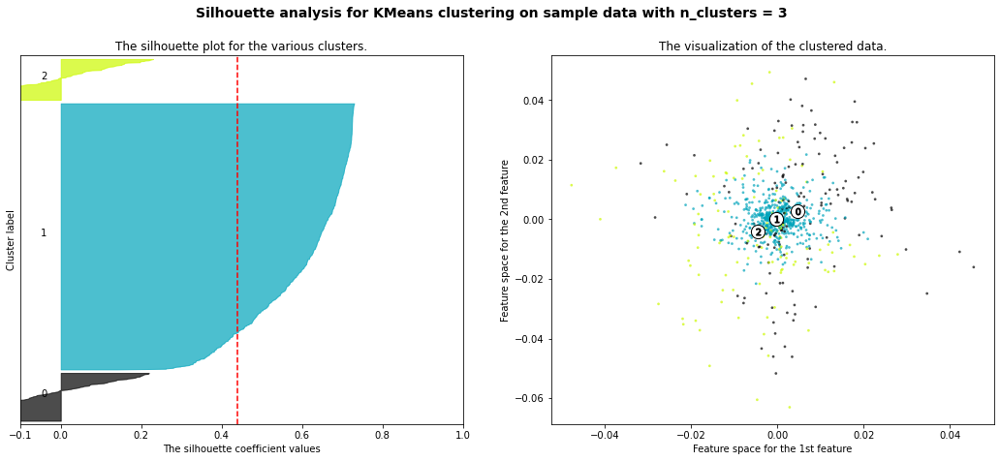

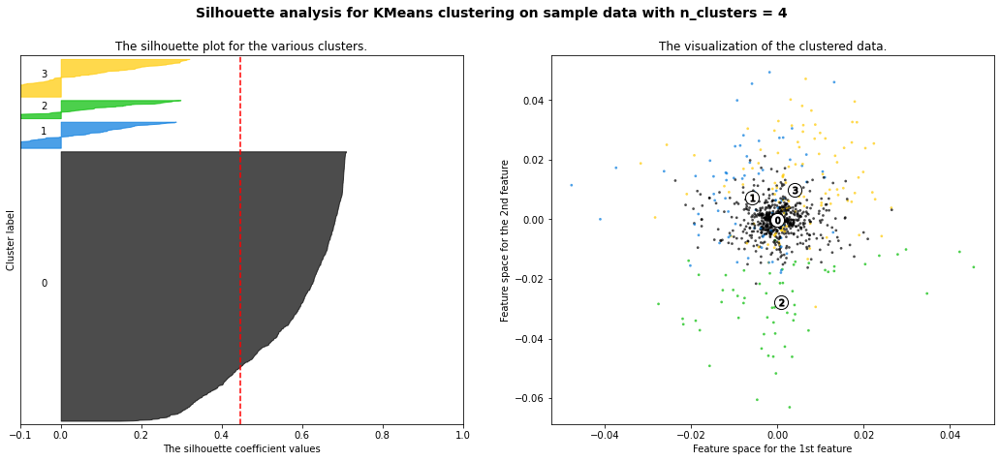

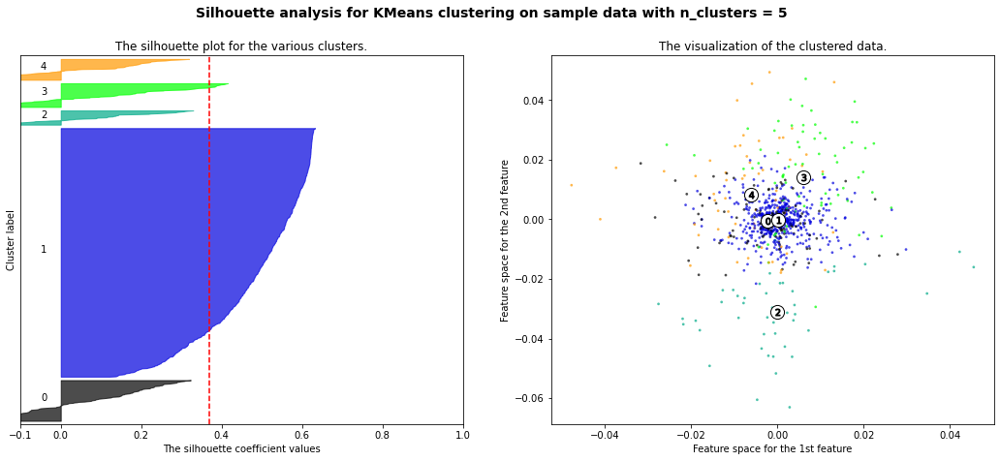

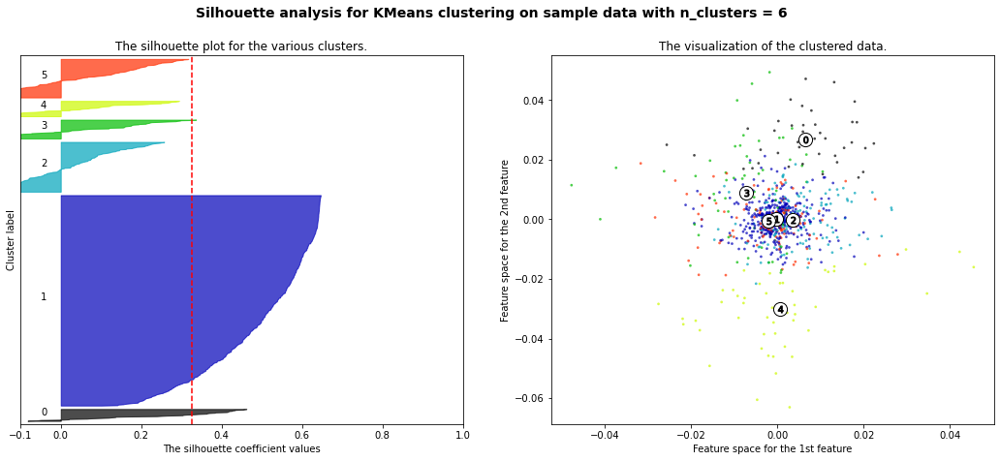

...

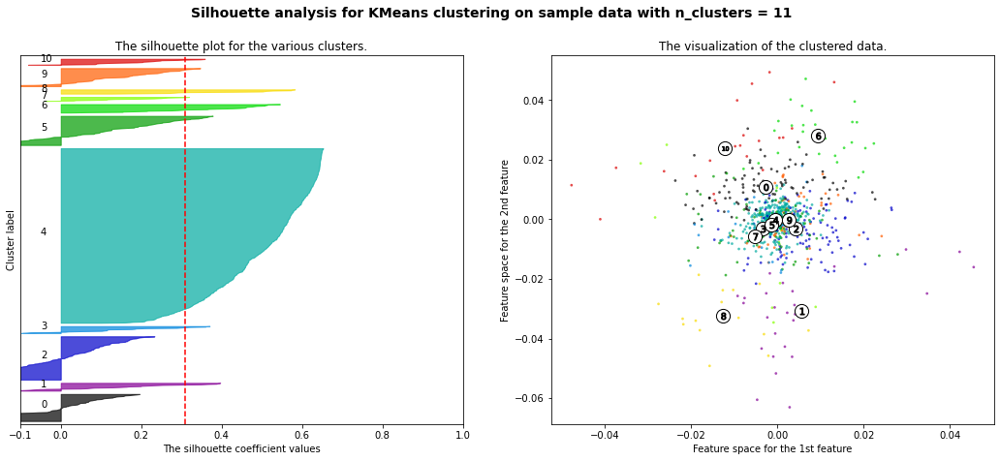

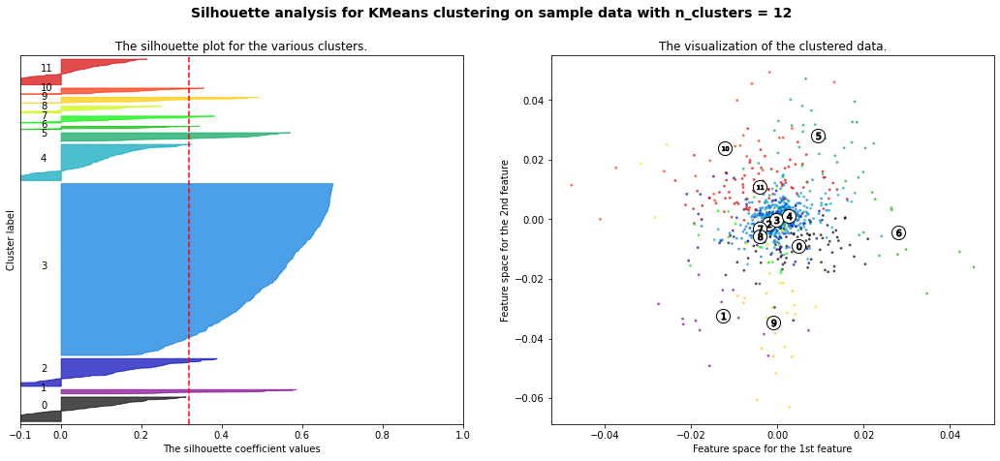

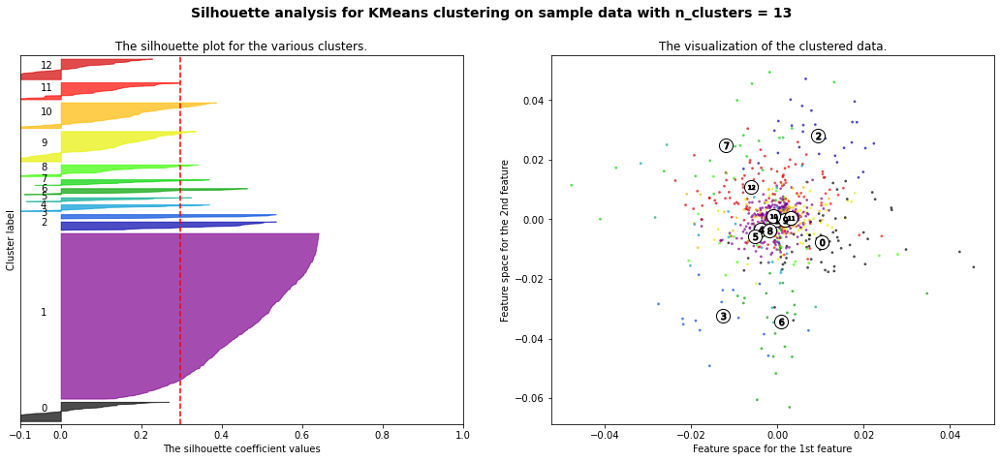

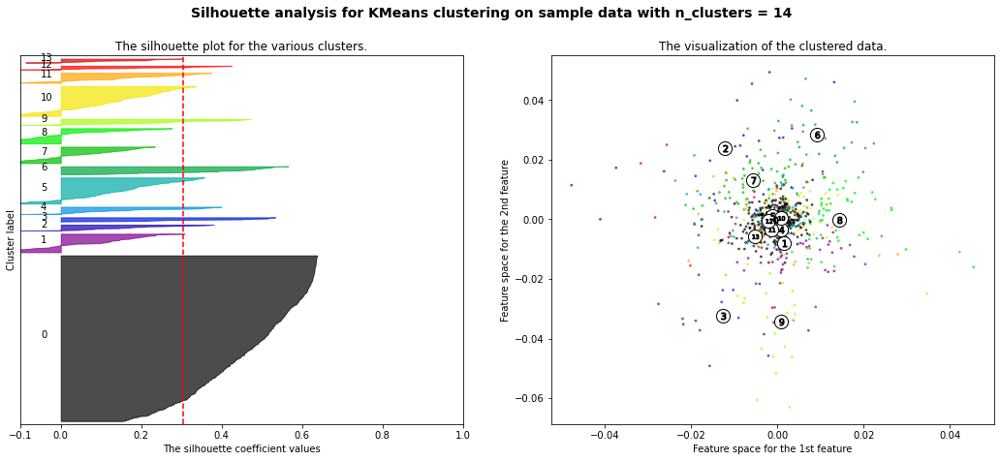

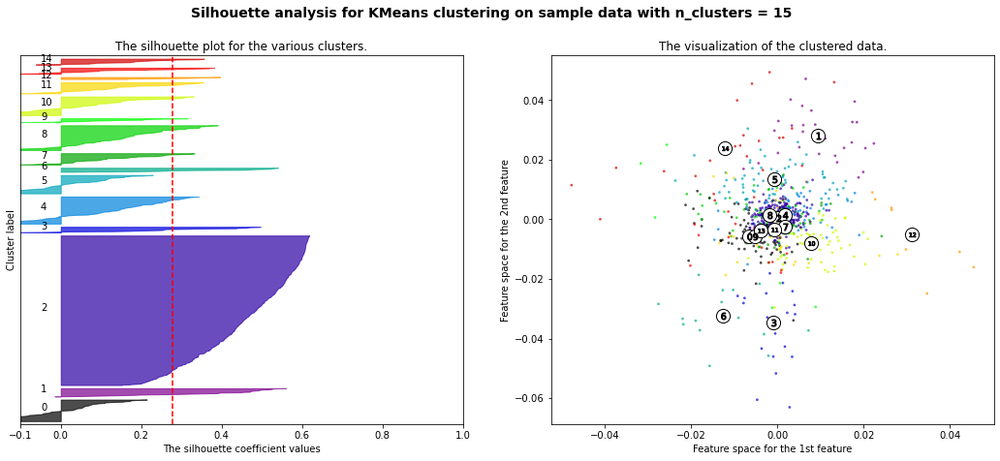

In [73]:
import matplotlib.cm as cm
import numpy as np
from sklearn.datasets import make_blobs

# Set X to array of data
c1_arr = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [2,3,4,5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(c1_arr) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(c1_arr)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(c1_arr, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(c1_arr, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        c1_arr[:, 0], c1_arr[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

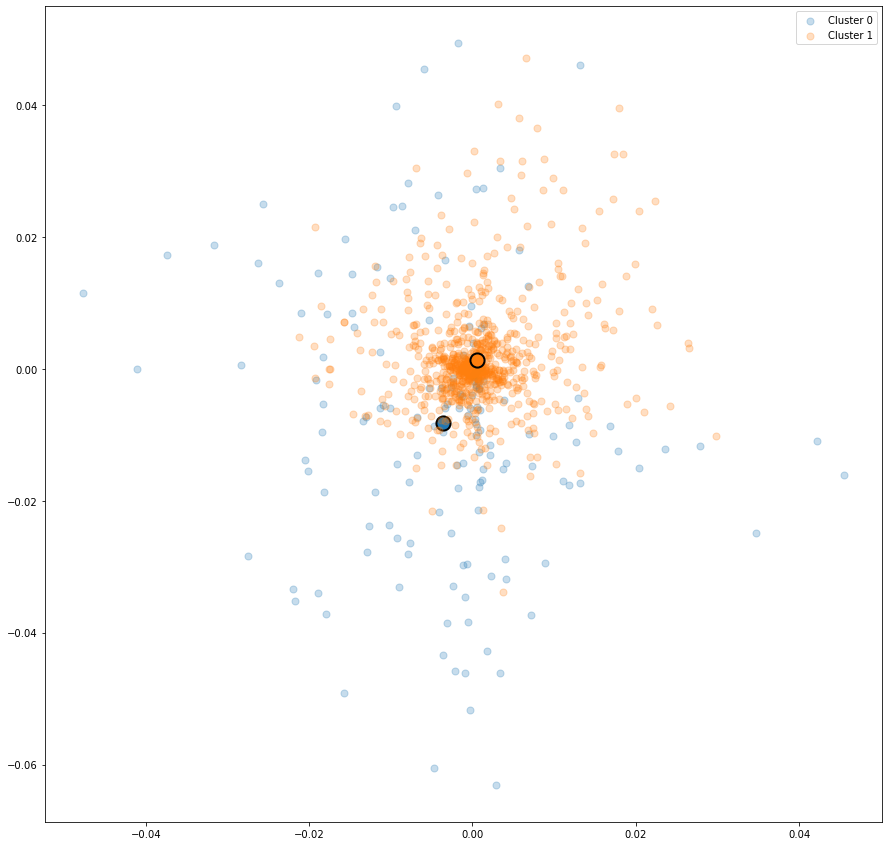

In [74]:
kmeans = KMeans(n_clusters=2).fit(c1_arr)
y_kmeans = kmeans.predict(c1_arr)
centers = kmeans.cluster_centers_
colors = cycle(cm.tab10.colors)
plt.rcParams["figure.figsize"] = (15,15)
for i in range(2):
    color = next(colors)
    idx = y_kmeans == i
    plt.scatter(c1_arr[idx, 0], c1_arr[idx, 1], color=color, s=50, label=f"Cluster {i}", alpha=0.25)  
    plt.scatter(centers[i, 0], centers[i, 1], edgecolors="k", linewidth=2, color=color, s=200, alpha=1)
plt.legend()

## 7. c3_va3

In [75]:
c3 = pd.read_csv('gesture_phase_dataset/c3_va3.csv')
c3

,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,Phase
0,-0.000055,0.000301,-0.000030,-0.000188,-0.000433,-0.000014,-0.000081,0.000311,-0.000020,-0.000183,...,-1.600000e-05,0.000307,0.000472,0.000322,0.000488,0.000019,0.000334,0.000017,0.000334,D
1,-0.007212,-0.008071,0.001036,-0.000754,-0.000367,-0.000004,-0.006947,-0.008142,0.001095,-0.000748,...,2.950000e-06,0.010873,0.000839,0.010759,0.000843,0.003074,0.000158,0.003041,0.000158,D
2,0.000023,-0.000243,-0.000073,-0.000217,0.000015,-0.000062,0.000200,-0.000621,-0.000143,-0.000216,...,-1.713000e-05,0.000255,0.000226,0.000668,0.000225,0.003062,0.000189,0.002985,0.000191,D
3,0.000528,-0.000363,0.000048,0.000352,0.000207,-0.000034,0.000244,-0.000723,-0.000124,0.000352,...,9.190000e-06,0.000642,0.000410,0.000773,0.000411,0.000184,0.000207,0.000039,0.000207,D
4,0.005357,0.005532,-0.000662,-0.000736,-0.000338,-0.000090,0.004929,0.005225,-0.000856,-0.000736,...,-1.621000e-05,0.007729,0.000815,0.007234,0.000814,0.002251,0.000358,0.002237,0.000358,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1439,-0.003709,-0.006168,0.000786,-0.000155,0.001088,-0.000144,-0.003815,-0.004658,0.000656,0.000060,...,-9.400000e-07,0.007240,0.001109,0.006056,0.000173,0.001976,0.000137,0.001575,0.000051,D
1440,-0.000727,0.001536,-0.000211,0.000700,-0.000975,0.000067,-0.001147,0.000177,0.000008,0.000423,...,1.234000e-05,0.001712,0.001202,0.001160,0.000515,0.002600,0.000701,0.001738,0.000124,D
1441,0.003074,0.007870,-0.000962,0.000526,-0.000779,0.000090,0.002786,0.005035,-0.000606,0.000413,...,2.327000e-05,0.008504,0.000944,0.005786,0.000431,0.002007,0.000071,0.001697,0.000112,D
1442,0.003297,0.008467,-0.001035,0.000578,-0.000740,0.000101,0.002947,0.005385,-0.000652,0.000580,...,1.541000e-05,0.009145,0.000944,0.006173,0.000699,0.000229,0.000023,0.000139,0.000113,D


In [76]:
c3.rename(columns={'1':'vlhx','2':'vlhy','3':'vlhz','4':'vrhx','5':'vrhy',
                   '6':'vrhz','7':'vlwx','8':'vlwy','9':'vlwz','10':'vrwx',
                   '11':'vrwy','12':'vrwz','13':'alhx','14':'alhy','15':'alhz',
                   '16':'arhx','17':'arhy','18':'arhz','19':'alwx','20':'alwy',
                   '21':'alwz','22':'arwx','23':'arwy','24':'arwz','25':'slh',
                   '26': 'srh','27':'slw','28':'srw','29':'slh2','30':'srh2',
                   '31':'slw2','32':'srw2'}, inplace = True)
c3

,vlhx,vlhy,vlhz,vrhx,vrhy,vrhz,vlwx,vlwy,vlwz,vrwx,...,arwz,slh,srh,slw,srw,slh2,srh2,slw2,srw2,Phase
0,-0.000055,0.000301,-0.000030,-0.000188,-0.000433,-0.000014,-0.000081,0.000311,-0.000020,-0.000183,...,-1.600000e-05,0.000307,0.000472,0.000322,0.000488,0.000019,0.000334,0.000017,0.000334,D
1,-0.007212,-0.008071,0.001036,-0.000754,-0.000367,-0.000004,-0.006947,-0.008142,0.001095,-0.000748,...,2.950000e-06,0.010873,0.000839,0.010759,0.000843,0.003074,0.000158,0.003041,0.000158,D
2,0.000023,-0.000243,-0.000073,-0.000217,0.000015,-0.000062,0.000200,-0.000621,-0.000143,-0.000216,...,-1.713000e-05,0.000255,0.000226,0.000668,0.000225,0.003062,0.000189,0.002985,0.000191,D
3,0.000528,-0.000363,0.000048,0.000352,0.000207,-0.000034,0.000244,-0.000723,-0.000124,0.000352,...,9.190000e-06,0.000642,0.000410,0.000773,0.000411,0.000184,0.000207,0.000039,0.000207,D
4,0.005357,0.005532,-0.000662,-0.000736,-0.000338,-0.000090,0.004929,0.005225,-0.000856,-0.000736,...,-1.621000e-05,0.007729,0.000815,0.007234,0.000814,0.002251,0.000358,0.002237,0.000358,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1439,-0.003709,-0.006168,0.000786,-0.000155,0.001088,-0.000144,-0.003815,-0.004658,0.000656,0.000060,...,-9.400000e-07,0.007240,0.001109,0.006056,0.000173,0.001976,0.000137,0.001575,0.000051,D
1440,-0.000727,0.001536,-0.000211,0.000700,-0.000975,0.000067,-0.001147,0.000177,0.000008,0.000423,...,1.234000e-05,0.001712,0.001202,0.001160,0.000515,0.002600,0.000701,0.001738,0.000124,D
1441,0.003074,0.007870,-0.000962,0.000526,-0.000779,0.000090,0.002786,0.005035,-0.000606,0.000413,...,2.327000e-05,0.008504,0.000944,0.005786,0.000431,0.002007,0.000071,0.001697,0.000112,D
1442,0.003297,0.008467,-0.001035,0.000578,-0.000740,0.000101,0.002947,0.005385,-0.000652,0.000580,...,1.541000e-05,0.009145,0.000944,0.006173,0.000699,0.000229,0.000023,0.000139,0.000113,D


In [77]:
c1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1107 entries, 0 to 1106
Data columns (total 33 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vlhx    1107 non-null   float64
 1   vlhy    1107 non-null   float64
 2   vlhz    1107 non-null   float64
 3   vrhx    1107 non-null   float64
 4   vrhy    1107 non-null   float64
 5   vrhz    1107 non-null   float64
 6   vlwx    1107 non-null   float64
 7   vlwy    1107 non-null   float64
 8   vlwz    1107 non-null   float64
 9   vrwx    1107 non-null   float64
 10  vrwy    1107 non-null   float64
 11  vrwz    1107 non-null   float64
 12  alhx    1107 non-null   float64
 13  alhy    1107 non-null   float64
 14  alhz    1107 non-null   float64
 15  arhx    1107 non-null   float64
 16  arhy    1107 non-null   float64
 17  arhz    1107 non-null   float64
 18  alwx    1107 non-null   float64
 19  alwy    1107 non-null   float64
 20  alwz    1107 non-null   float64
 21  arwx    1107 non-null   float64
 22  

In [78]:
c3['Phase'].value_counts()

S    389
D    358
P    338
R    215
H    144
Name: Phase, dtype: int64

In [79]:
Row_list =[]
  
# Iterate over each row
for index, rows in c3.iterrows():
    # Create list for the current row
    my_list =[rows.vlhx, rows.vlhy, rows.vlhz, 
              rows.vrhx, rows.vrhy, rows.vrhz, 
              rows.vlwx, rows.vlwy, rows.vlwz, 
              rows.vrwx, rows.vrwy, rows.vrwz, 
              rows.alhx, rows.alhy, rows.alhz, 
              rows.arhx, rows.arhy, rows.arhz,
              rows.alwx, rows.alwy, rows.alwz,
              rows.arwx, rows.arwy, rows.arwz,
              rows.slh, rows.srh, rows.slw,
              rows.srw, rows.slh2, rows.srh2,
              rows.slw2, rows.srw2
             ]
      
    # append the list to the final list
    Row_list.append(my_list)

Row_arr = np.asarray(Row_list)
Row_arr

array([[-5.48700e-05,  3.01000e-04, -3.04800e-05, ...,  3.33740e-04,
         1.66200e-05,  3.34000e-04],
       [-7.21181e-03, -8.07053e-03,  1.03633e-03, ...,  1.58120e-04,
         3.04092e-03,  1.57980e-04],
       [ 2.25200e-05, -2.43360e-04, -7.29100e-05, ...,  1.89100e-04,
         2.98546e-03,  1.91160e-04],
       ...,
       [ 3.07408e-03,  7.87019e-03, -9.62140e-04, ...,  7.11700e-05,
         1.69731e-03,  1.11780e-04],
       [ 3.29680e-03,  8.46747e-03, -1.03479e-03, ...,  2.32600e-05,
         1.38730e-04,  1.13470e-04],
       [ 2.04320e-04, -4.04600e-05,  5.77500e-05, ...,  3.69200e-05,
         1.83985e-03,  3.59900e-05]])

For n_clusters = 2 The average silhouette_score is : 0.5133522342008745
For n_clusters = 3 The average silhouette_score is : 0.5302571068874128
For n_clusters = 4 The average silhouette_score is : 0.5271431268656744
For n_clusters = 5 The average silhouette_score is : 0.33486729899939777
For n_clusters = 6 The average silhouette_score is : 0.3304129675749546
For n_clusters = 7 The average silhouette_score is : 0.31483832772747145
For n_clusters = 8 The average silhouette_score is : 0.30018366492278925
For n_clusters = 9 The average silhouette_score is : 0.2905461215244093
For n_clusters = 10 The average silhouette_score is : 0.2966918215309881
For n_clusters = 11 The average silhouette_score is : 0.2905759647602624
For n_clusters = 12 The average silhouette_score is : 0.2981259912457721
For n_clusters = 13 The average silhouette_score is : 0.297367441473836
For n_clusters = 14 The average silhouette_score is : 0.2569347510720438
For n_clusters = 15 The average silhouette_score is : 0.2

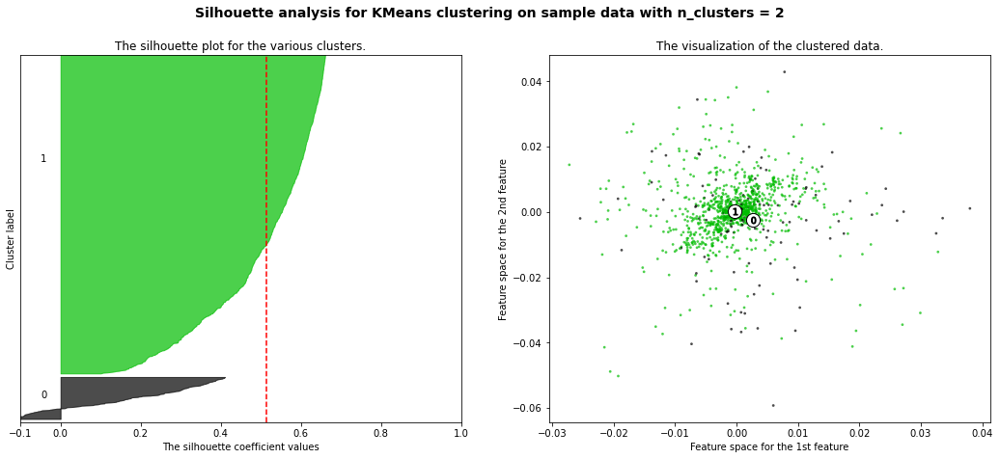

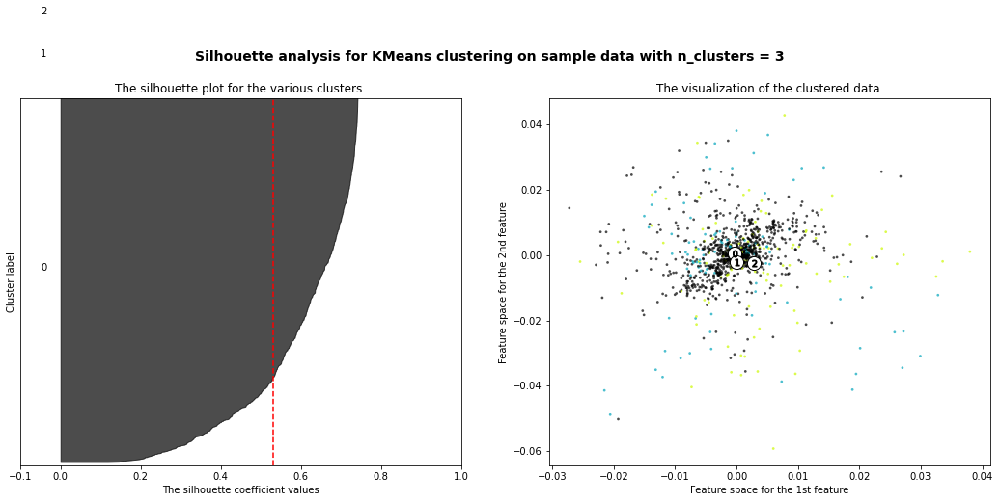

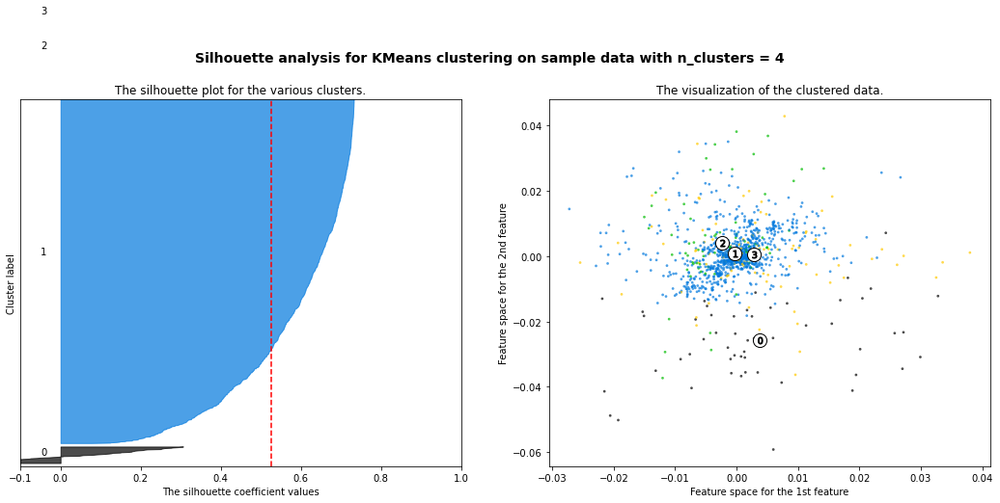

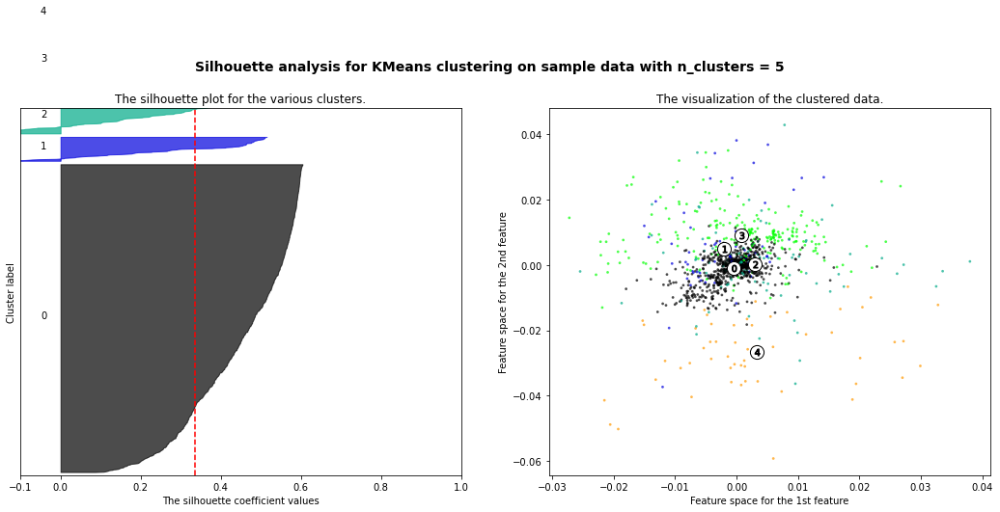

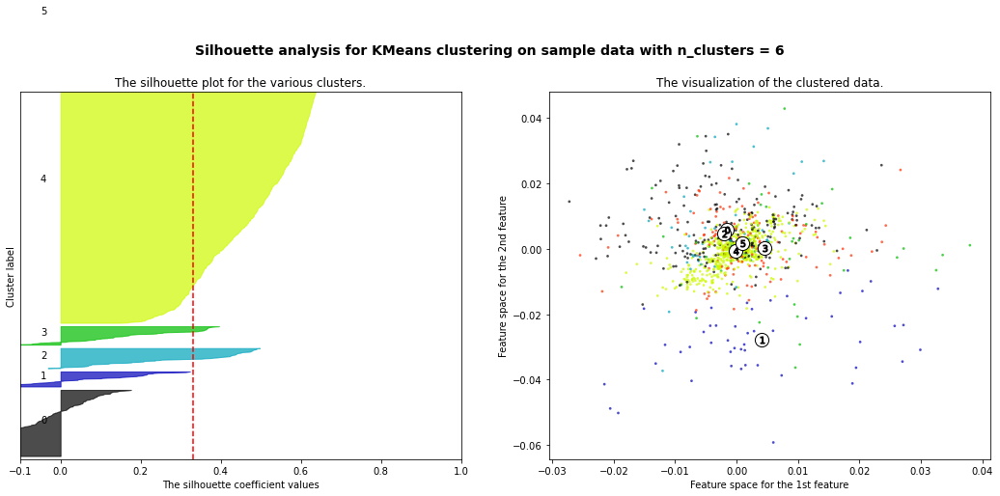

...

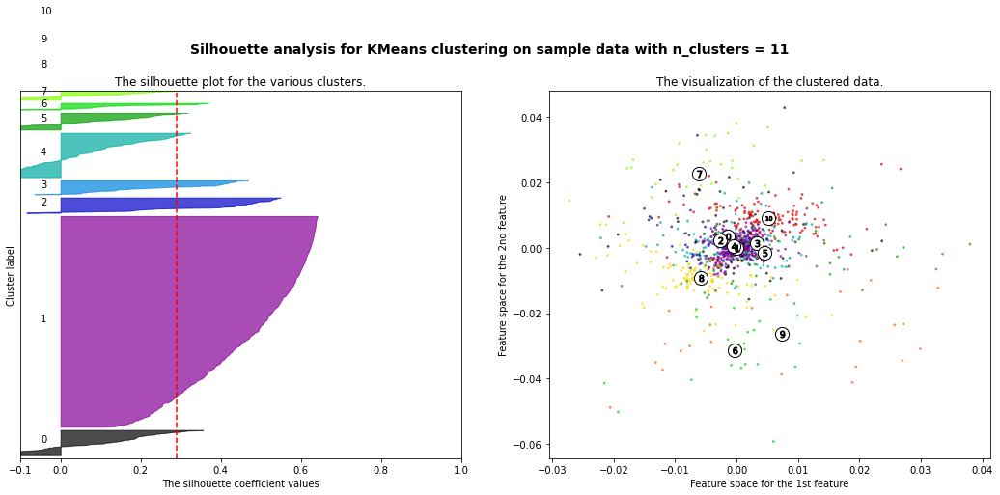

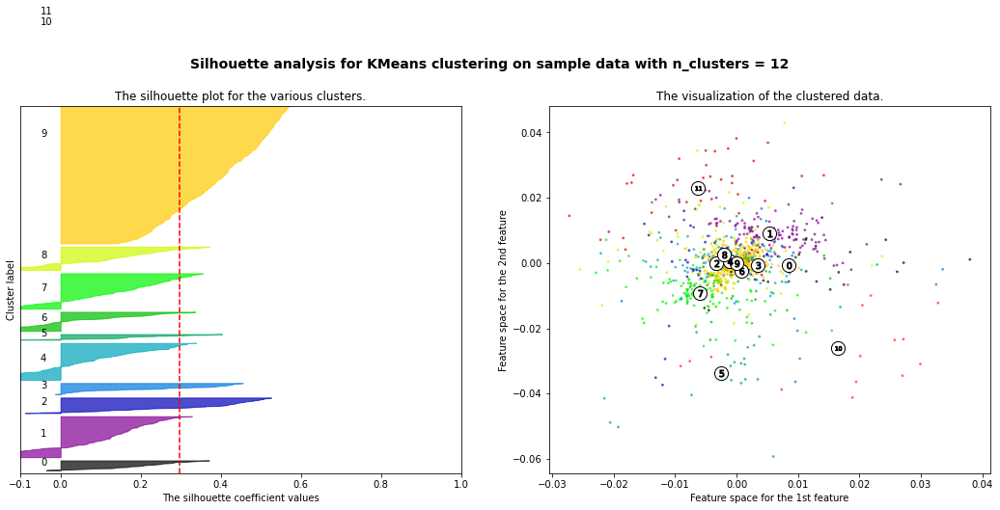

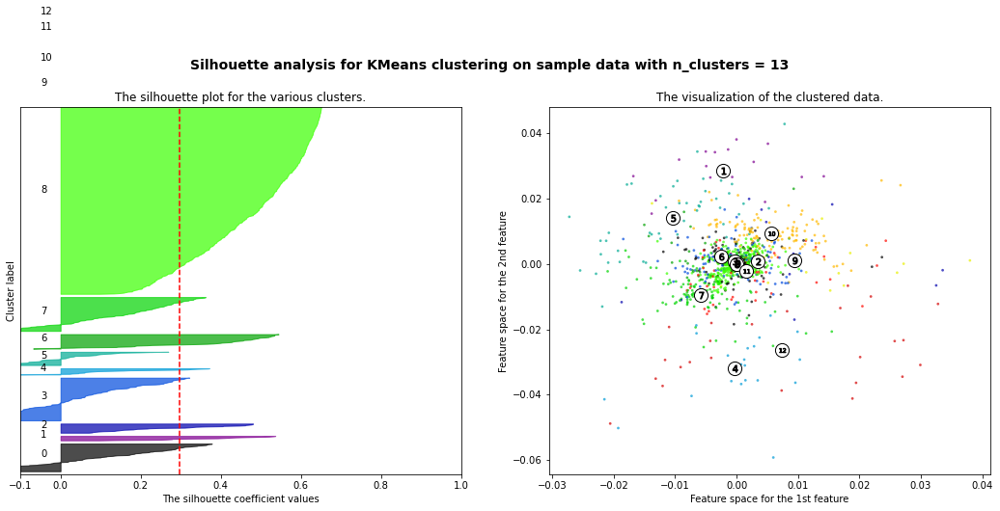

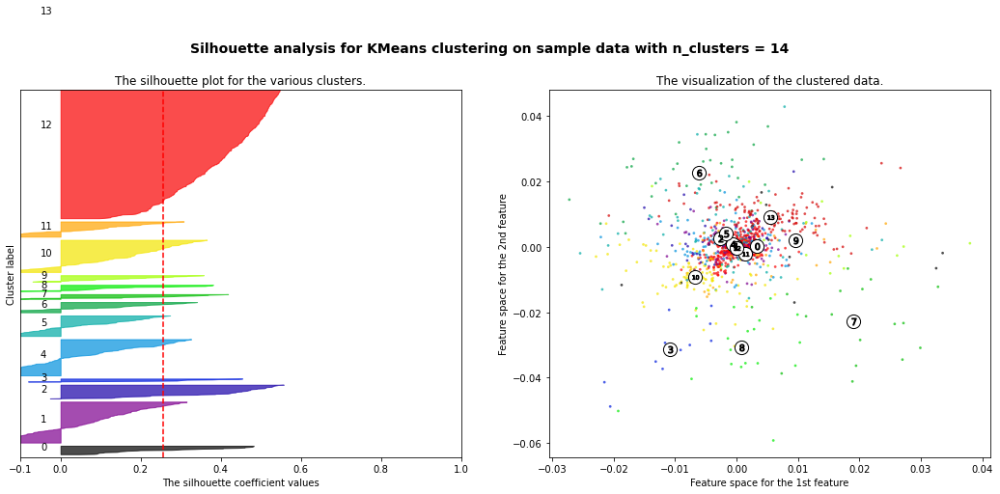

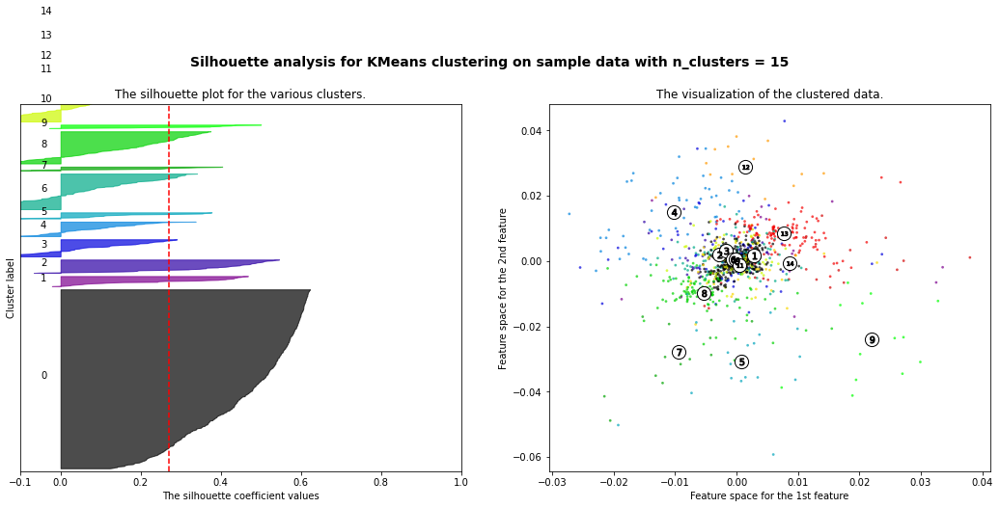

In [80]:
import matplotlib.cm as cm
import numpy as np
from sklearn.datasets import make_blobs

# Set X to array of data
c3_arr = Row_arr

# Range of cluster 5 - 20
range_n_clusters = [2,3,4,5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(c1_arr) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(c3_arr)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(c3_arr, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(c3_arr, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        c3_arr[:, 0], c3_arr[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

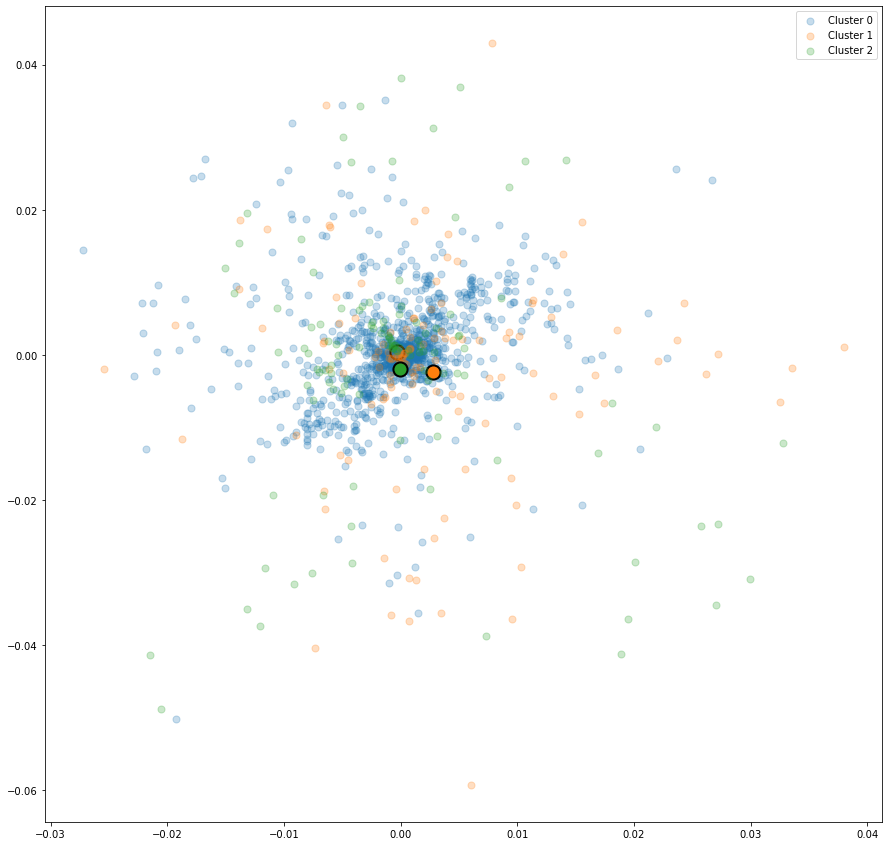

In [81]:
kmeans = KMeans(n_clusters=3).fit(c3_arr)
y_kmeans = kmeans.predict(c3_arr)
centers = kmeans.cluster_centers_
colors = cycle(cm.tab10.colors)
plt.rcParams["figure.figsize"] = (15,15)
for i in range(3):
    color = next(colors)
    idx = y_kmeans == i
    plt.scatter(c3_arr[idx, 0], c3_arr[idx, 1], color=color, s=50, label=f"Cluster {i}", alpha=0.25)  
    plt.scatter(centers[i, 0], centers[i, 1], edgecolors="k", linewidth=2, color=color, s=200, alpha=1)
plt.legend()